In [14]:
import numpy as np
import gym
from gym import wrappers
import random
import math
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [15]:
EPISODES = 200  # number of episodes
EPS_START = 0.9  # e-greedy threshold start value
EPS_END = 0.05  # e-greedy threshold end value
EPS_DECAY = 200  # e-greedy threshold decay
GAMMA = 0.8  # Q-learning discount factor
LR = 0.001  # NN optimizer learning rate
HIDDEN_LAYER = 256  # NN hidden layer size
BATCH_SIZE = 64  # Q-learning batch size

savedStates = []
LastRunsRewardSums = [0,0,0,0,0]
# if gpu is to be used
use_cuda = torch.cuda.is_available()
FloatTensor = torch.cuda.FloatTensor if use_cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if use_cuda else torch.LongTensor
ByteTensor = torch.cuda.ByteTensor if use_cuda else torch.ByteTensor
Tensor = FloatTensor

In [16]:
class ReplayMemory:
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = []

    def push(self, transition):
        self.memory.append(transition)
        if len(self.memory) > self.capacity:
            del self.memory[0]

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)


class Network(nn.Module):
    def __init__(self):
        nn.Module.__init__(self)
        self.l1 = nn.Linear(4, HIDDEN_LAYER)
        self.l2 = nn.Linear(HIDDEN_LAYER, 2)

    def forward(self, x):
        x = F.relu(self.l1(x))
        x = self.l2(x)
        return x

In [17]:
env = gym.make('CartPole-v0')
# env = wrappers.Monitor(env, '.', force=True)

model = Network()
if use_cuda:
    model.cuda()
memory = ReplayMemory(10000)
optimizer = optim.Adam(model.parameters(), LR)
steps_done = 0
episode_durations = []

In [18]:
def select_action(state):
    global steps_done
    sample = random.random()
    eps_threshold = EPS_END + (EPS_START - EPS_END) * math.exp(-1. * steps_done / EPS_DECAY)
    steps_done += 1
    
        
    if sample > eps_threshold:
        return model(Variable(state).type(FloatTensor)).data.max(1)[1].view(1, 1)
    else:
        return LongTensor([[random.randrange(2)]])

In [19]:

from threading import local


def run_episode(e, environment):
    localsavedstates = []
    state = environment.reset()
    steps = 0
    global LastRunsRewardSums
    global savedStates
    saveData = 180 < sum(LastRunsRewardSums)/len(LastRunsRewardSums)
    rewardsum = 0
    while True:
        environment.render()
        action = select_action(FloatTensor([state]))
        next_state, reward, done, _ = environment.step(action[0, 0].item() )

        # negative reward when attempt ends
        if done:
            reward = -1

        if saveData:
            localsavedstates.append((state.tolist(),action.item()))

        memory.push((FloatTensor([state]),
                     action,  # action is already a tensor
                     FloatTensor([next_state]),
                     FloatTensor([reward])))

        learn()

        state = next_state
        steps += 1
        rewardsum+=reward
        if done:
            LastRunsRewardSums.append(rewardsum)
            LastRunsRewardSums = LastRunsRewardSums[1:6]
            if rewardsum > 180:
                savedStates = savedStates + localsavedstates[0:-20]
            localsavedstates = []
            
            print(LastRunsRewardSums)
            print("{2} Episode {0} finished after {1} steps"
                  .format(e, steps, '\033[92m' if steps >= 195 else '\033[99m'))
            episode_durations.append(steps)
            plot_durations()
            break



In [20]:
def learn():
    if len(memory) < BATCH_SIZE:
        return

    # random transition batch is taken from experience replay memory
    transitions = memory.sample(BATCH_SIZE)
    batch_state, batch_action, batch_next_state, batch_reward = zip(*transitions)

    batch_state = Variable(torch.cat(batch_state))
    batch_action = Variable(torch.cat(batch_action))
    batch_reward = Variable(torch.cat(batch_reward))
    batch_next_state = Variable(torch.cat(batch_next_state))

    # current Q values are estimated by NN for all actions
    current_q_values = model(batch_state).gather(1, batch_action)
    # expected Q values are estimated from actions which gives maximum Q value
    max_next_q_values = model(batch_next_state).detach().max(1)[0]
    expected_q_values = batch_reward + (GAMMA * max_next_q_values)
    

    # loss is measured from error between current and newly expected Q values
    loss = F.smooth_l1_loss(current_q_values, expected_q_values.view(-1,1))

    # backpropagation of loss to NN
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

In [21]:
def plot_durations():
    plt.figure(2)
    plt.clf()
    durations_t = torch.FloatTensor(episode_durations)
    plt.title('Training...')
    plt.xlabel('Episode')
    plt.ylabel('Duration')
    plt.plot(durations_t.numpy())
    # take 100 episode averages and plot them too
    if len(durations_t) >= 100:
        means = durations_t.unfold(0, 100, 1).mean(1).view(-1)
        means = torch.cat((torch.zeros(99), means))
        plt.plot(means.numpy())

    plt.pause(0.001)  # pause a bit so that plots are updated

[0, 0, 0, 0, 22.0]
 Episode 0 finished after 24 steps


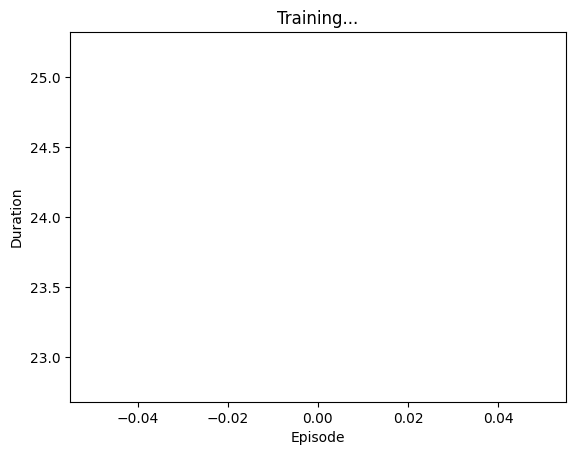

[0, 0, 0, 22.0, 49.0]
 Episode 1 finished after 51 steps


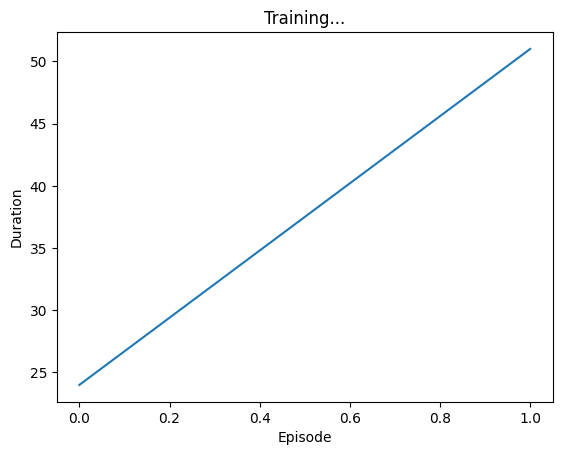

[0, 0, 22.0, 49.0, 71.0]
 Episode 2 finished after 73 steps


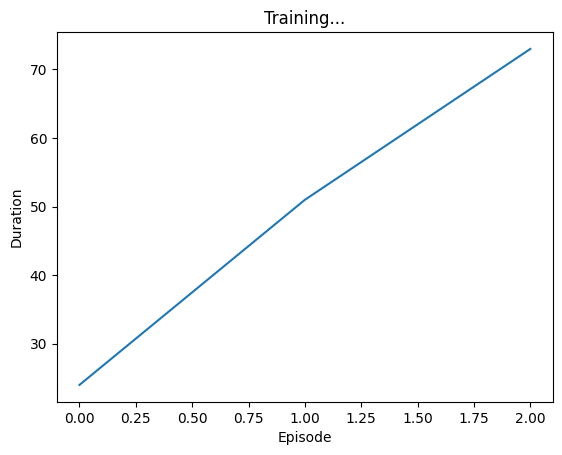

[0, 22.0, 49.0, 71.0, 10.0]
 Episode 3 finished after 12 steps


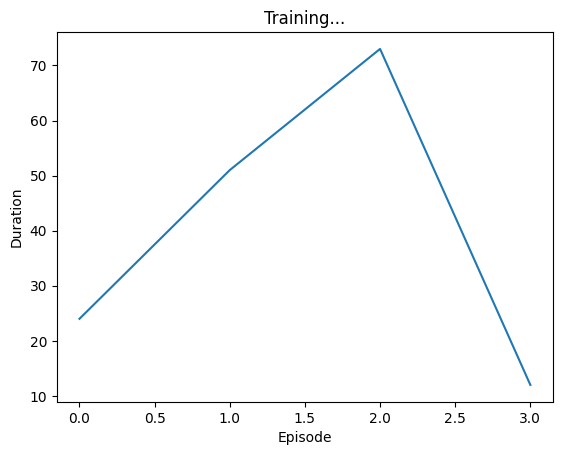

[22.0, 49.0, 71.0, 10.0, 9.0]
 Episode 4 finished after 11 steps


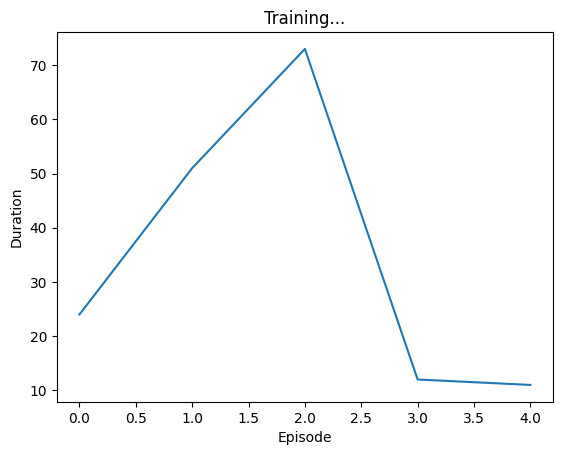

[49.0, 71.0, 10.0, 9.0, 9.0]
 Episode 5 finished after 11 steps


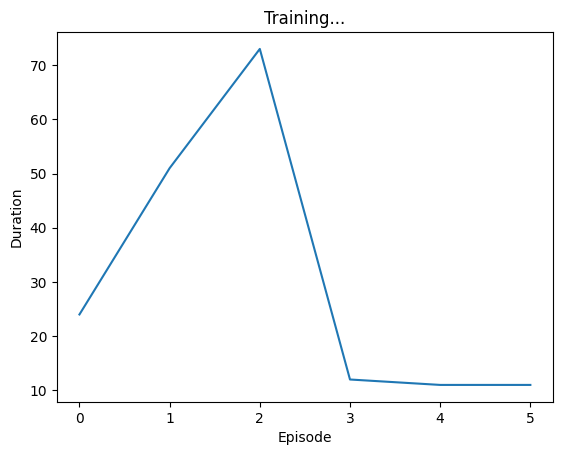

[71.0, 10.0, 9.0, 9.0, 10.0]
 Episode 6 finished after 12 steps


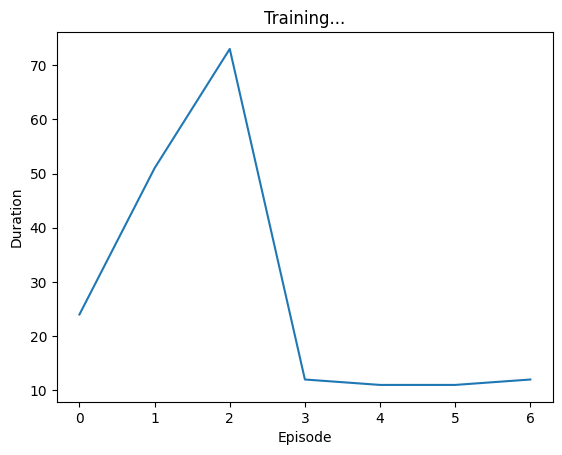

[10.0, 9.0, 9.0, 10.0, 7.0]
 Episode 7 finished after 9 steps


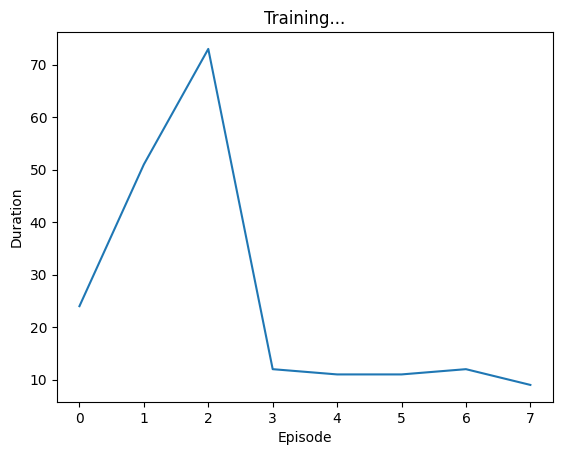

[9.0, 9.0, 10.0, 7.0, 10.0]
 Episode 8 finished after 12 steps


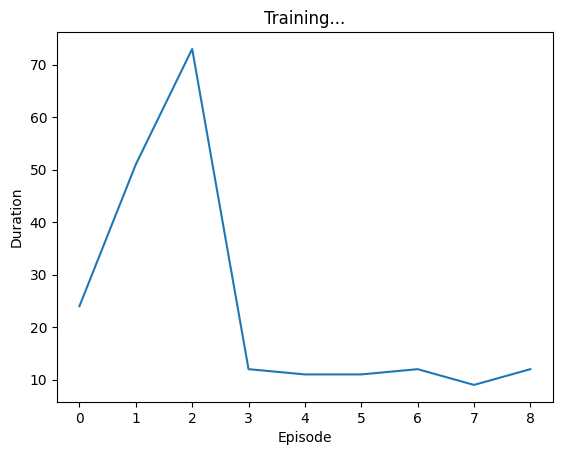

[9.0, 10.0, 7.0, 10.0, 16.0]
 Episode 9 finished after 18 steps


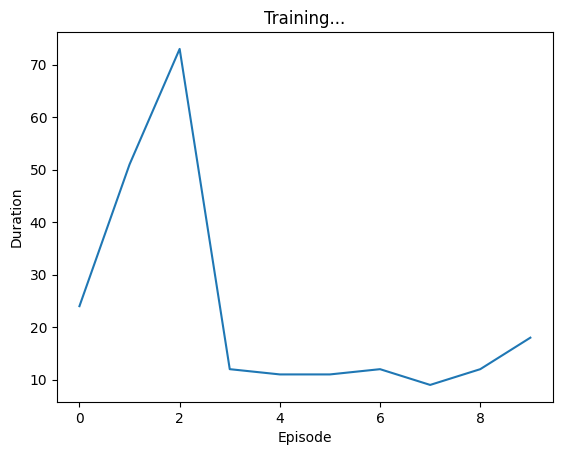

[10.0, 7.0, 10.0, 16.0, 7.0]
 Episode 10 finished after 9 steps


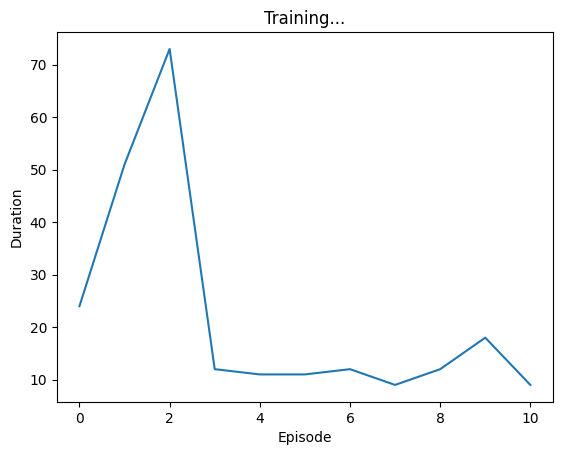

[7.0, 10.0, 16.0, 7.0, 9.0]
 Episode 11 finished after 11 steps


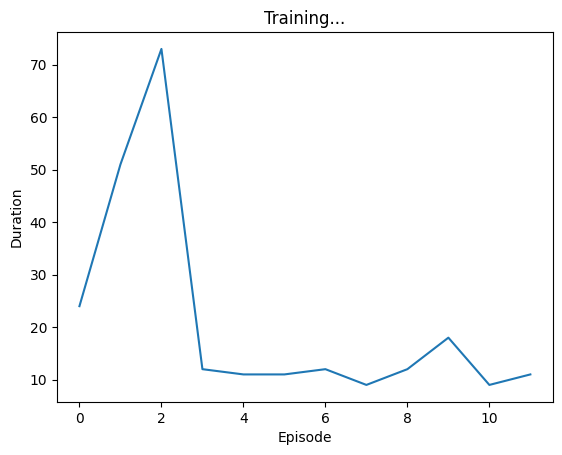

[10.0, 16.0, 7.0, 9.0, 30.0]
 Episode 12 finished after 32 steps


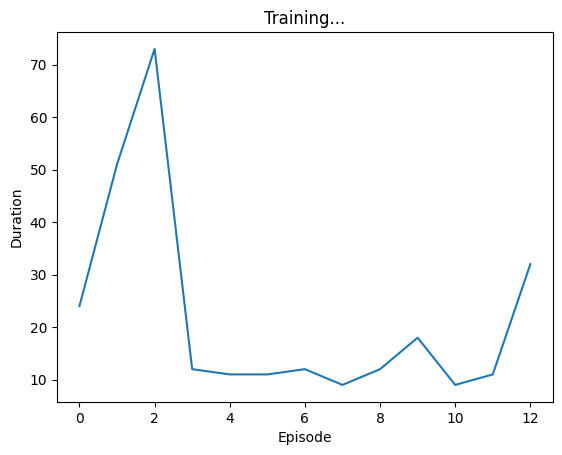

[16.0, 7.0, 9.0, 30.0, 10.0]
 Episode 13 finished after 12 steps


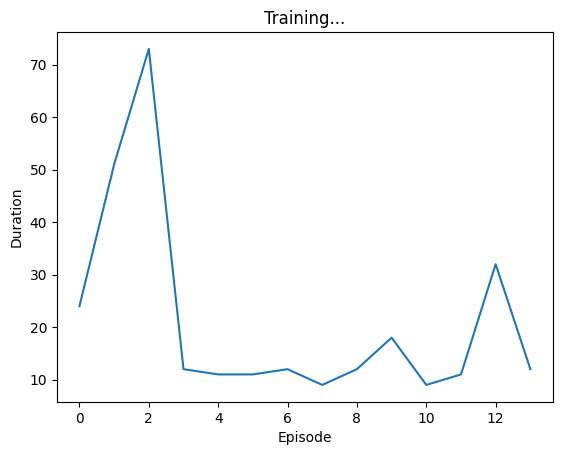

[7.0, 9.0, 30.0, 10.0, 8.0]
 Episode 14 finished after 10 steps


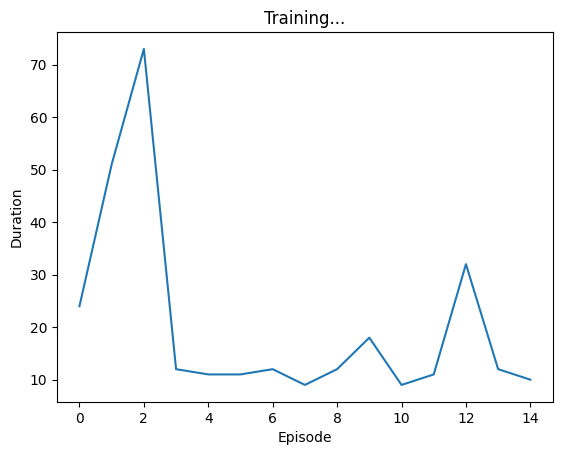

[9.0, 30.0, 10.0, 8.0, 8.0]
 Episode 15 finished after 10 steps


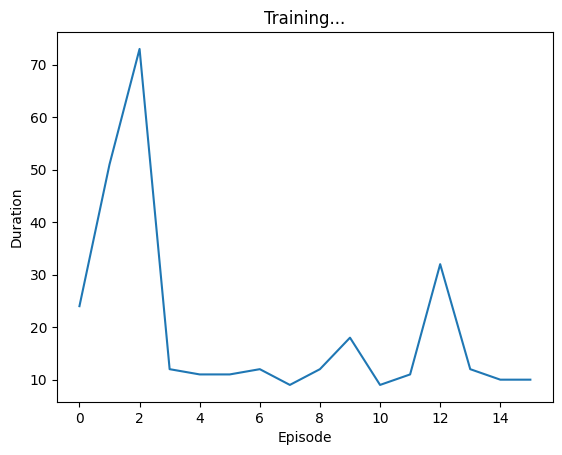

[30.0, 10.0, 8.0, 8.0, 8.0]
 Episode 16 finished after 10 steps


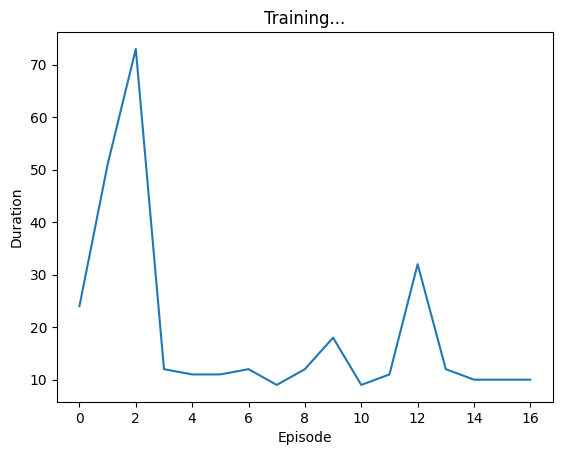

[10.0, 8.0, 8.0, 8.0, 8.0]
 Episode 17 finished after 10 steps


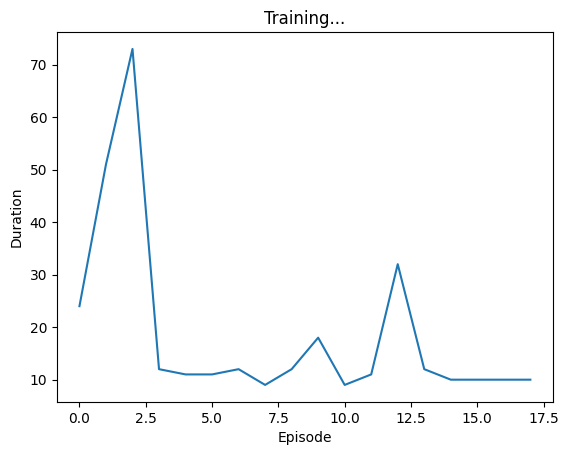

[8.0, 8.0, 8.0, 8.0, 37.0]
 Episode 18 finished after 39 steps


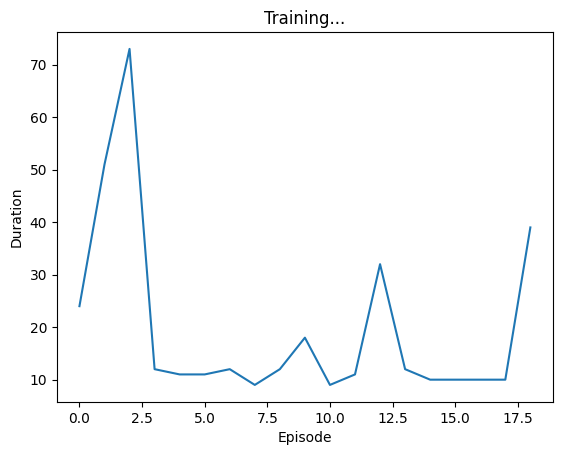

[8.0, 8.0, 8.0, 37.0, 8.0]
 Episode 19 finished after 10 steps


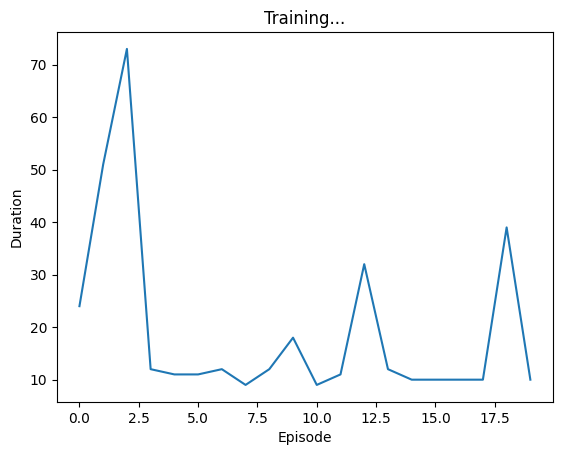

[8.0, 8.0, 37.0, 8.0, 51.0]
 Episode 20 finished after 53 steps


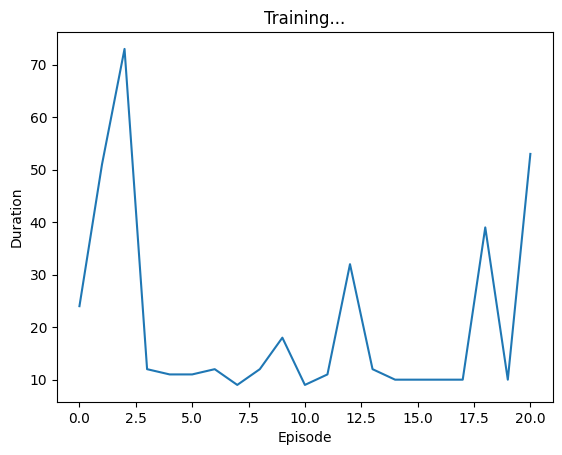

[8.0, 37.0, 8.0, 51.0, 35.0]
 Episode 21 finished after 37 steps


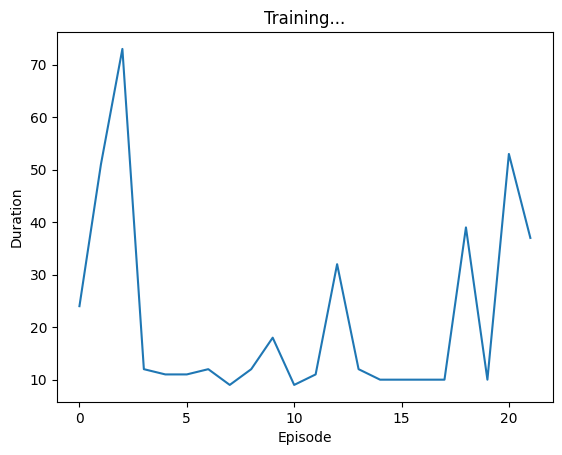

[37.0, 8.0, 51.0, 35.0, 43.0]
 Episode 22 finished after 45 steps


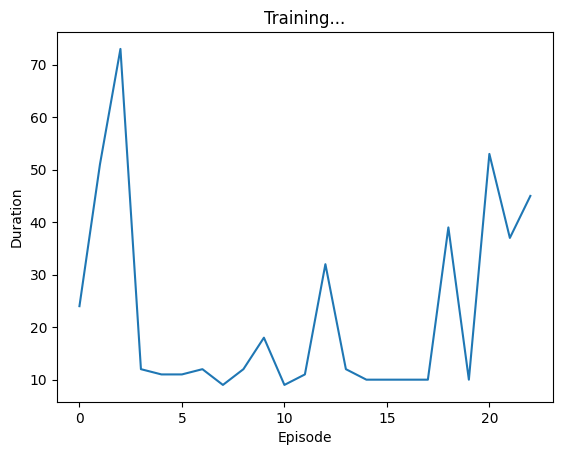

[8.0, 51.0, 35.0, 43.0, 88.0]
 Episode 23 finished after 90 steps


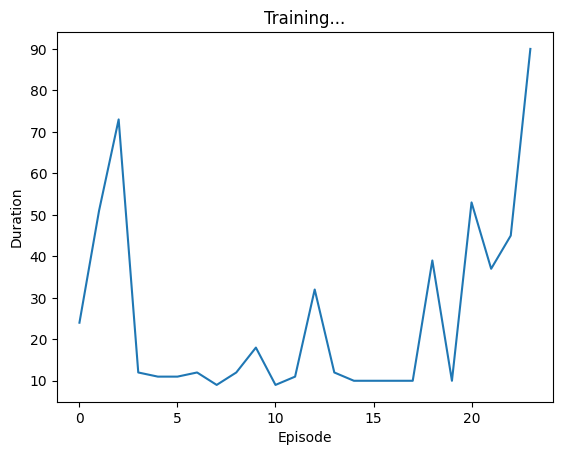

[51.0, 35.0, 43.0, 88.0, 86.0]
 Episode 24 finished after 88 steps


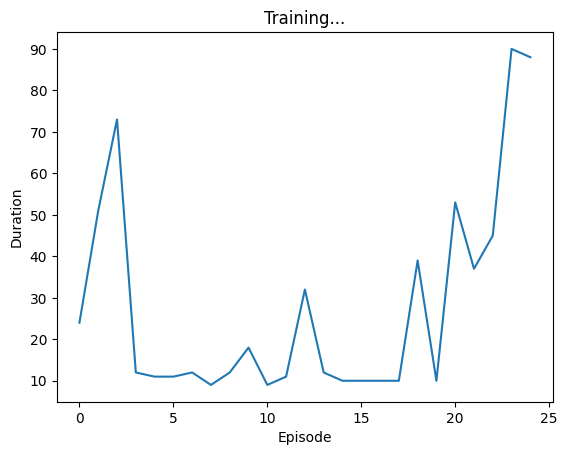

[35.0, 43.0, 88.0, 86.0, 76.0]
 Episode 25 finished after 78 steps


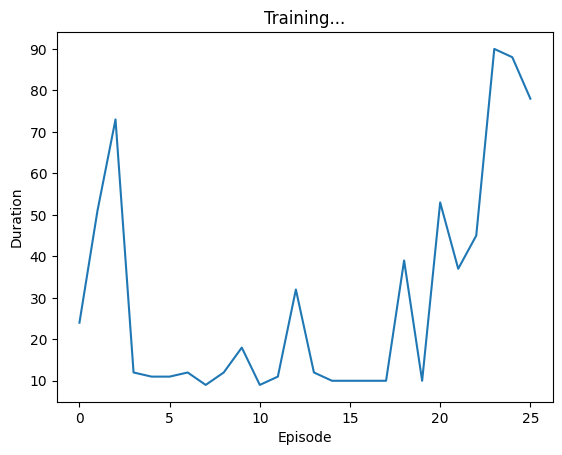

[43.0, 88.0, 86.0, 76.0, 83.0]
 Episode 26 finished after 85 steps


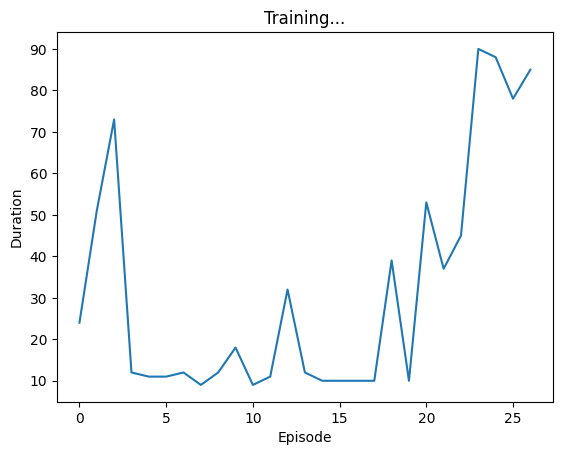

[88.0, 86.0, 76.0, 83.0, 113.0]
 Episode 27 finished after 115 steps


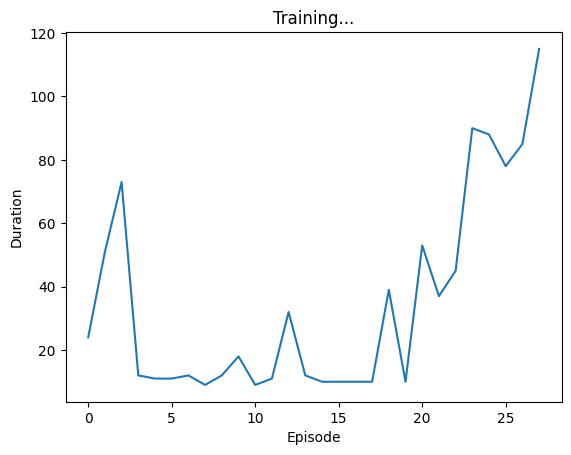

[86.0, 76.0, 83.0, 113.0, 109.0]
 Episode 28 finished after 111 steps


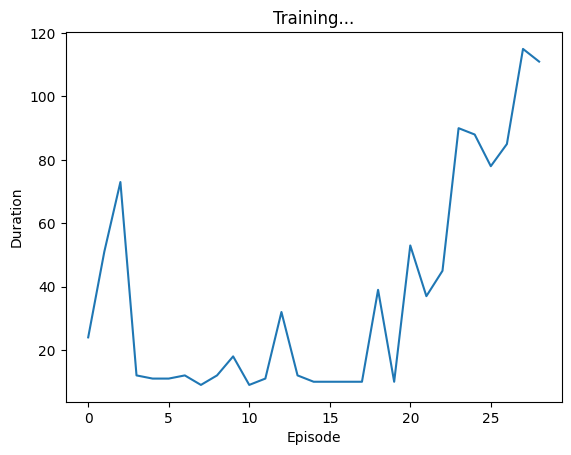

[76.0, 83.0, 113.0, 109.0, 133.0]
 Episode 29 finished after 135 steps


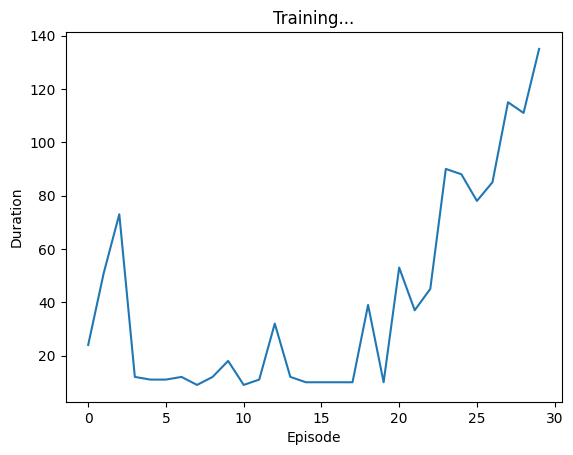

[83.0, 113.0, 109.0, 133.0, 133.0]
 Episode 30 finished after 135 steps


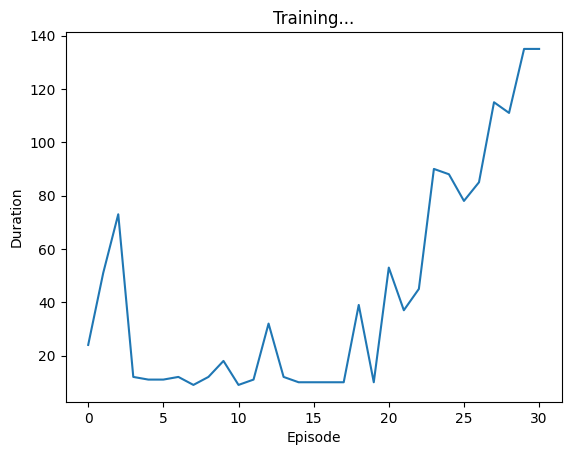

[113.0, 109.0, 133.0, 133.0, 121.0]
 Episode 31 finished after 123 steps


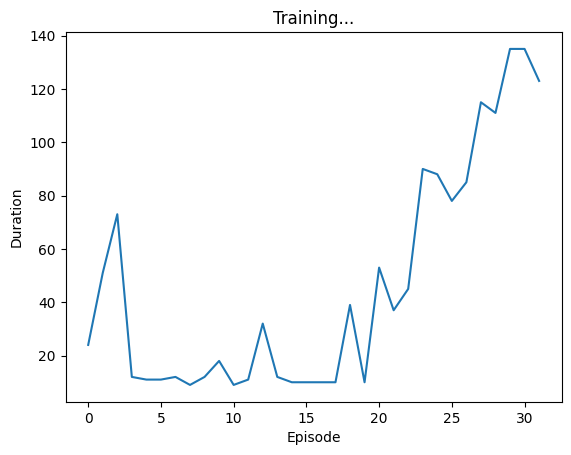

[109.0, 133.0, 133.0, 121.0, 156.0]
 Episode 32 finished after 158 steps


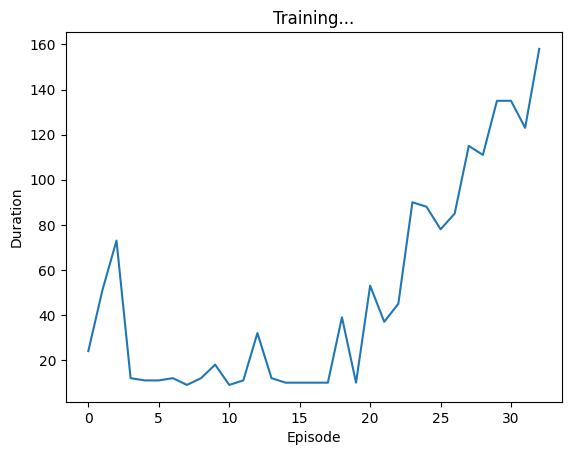

[133.0, 133.0, 121.0, 156.0, 121.0]
 Episode 33 finished after 123 steps


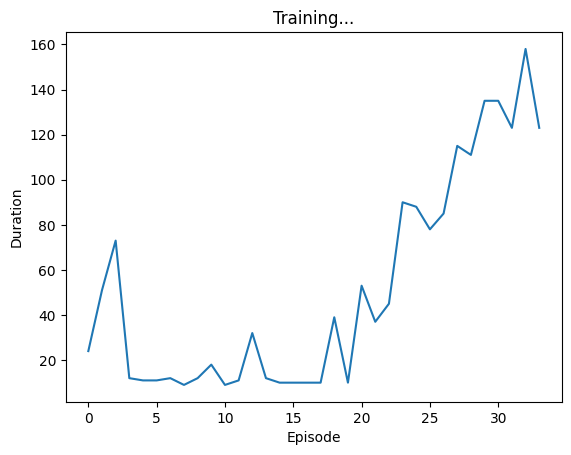

[133.0, 121.0, 156.0, 121.0, 107.0]
 Episode 34 finished after 109 steps


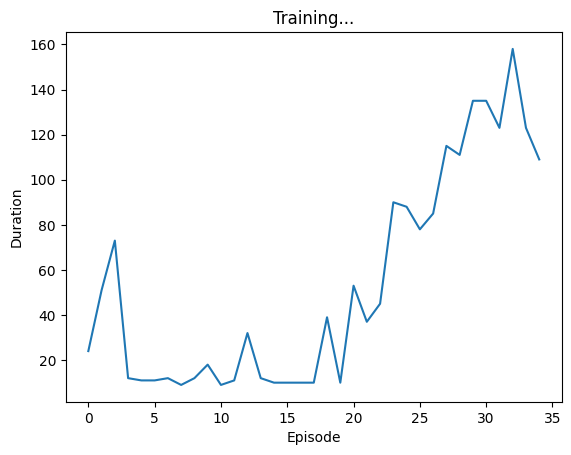

[121.0, 156.0, 121.0, 107.0, 139.0]
 Episode 35 finished after 141 steps


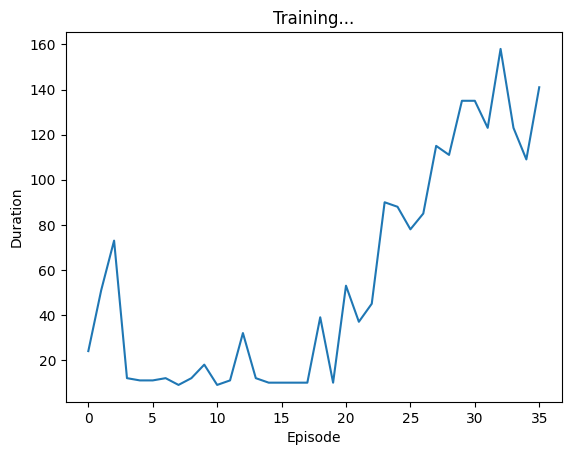

[156.0, 121.0, 107.0, 139.0, 144.0]
 Episode 36 finished after 146 steps


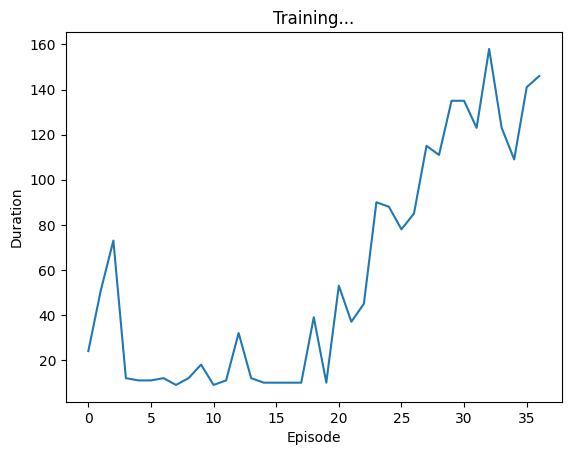

[121.0, 107.0, 139.0, 144.0, 119.0]
 Episode 37 finished after 121 steps


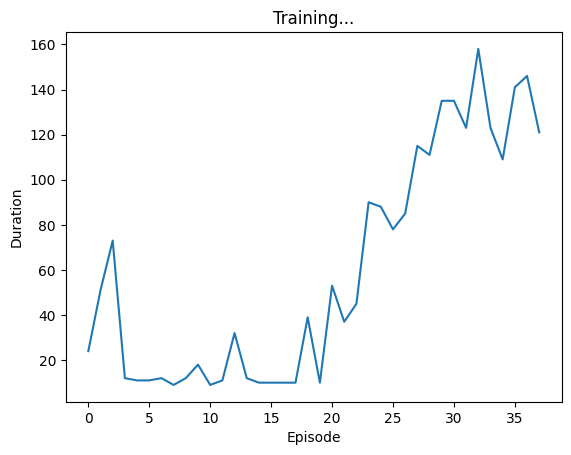

[107.0, 139.0, 144.0, 119.0, 123.0]
 Episode 38 finished after 125 steps


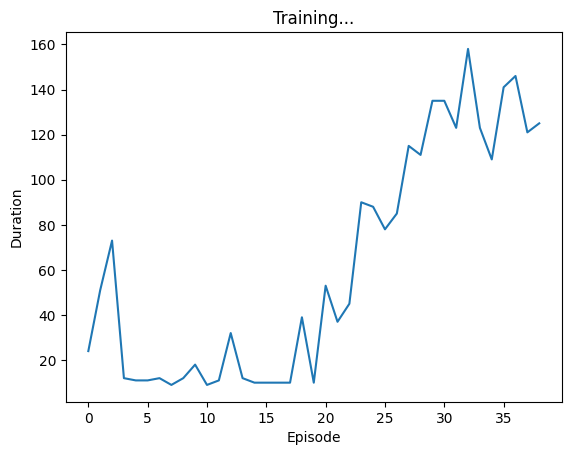

[139.0, 144.0, 119.0, 123.0, 136.0]
 Episode 39 finished after 138 steps


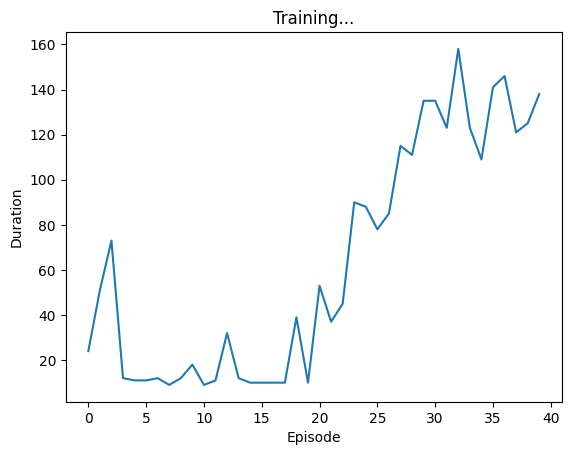

[144.0, 119.0, 123.0, 136.0, 171.0]
 Episode 40 finished after 173 steps


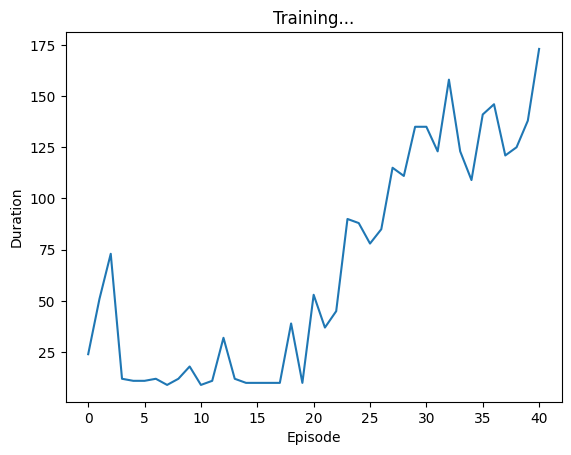

[119.0, 123.0, 136.0, 171.0, 166.0]
 Episode 41 finished after 168 steps


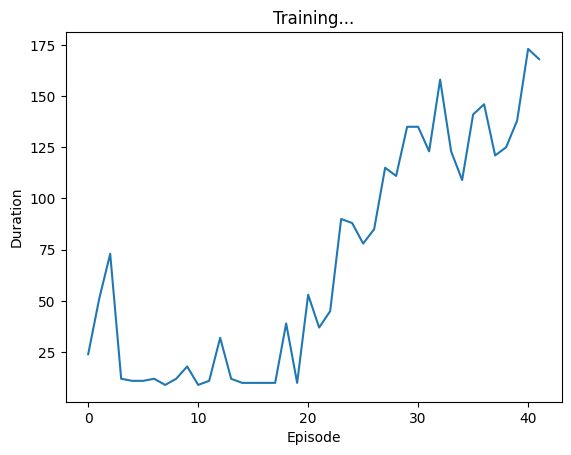

[123.0, 136.0, 171.0, 166.0, 144.0]
 Episode 42 finished after 146 steps


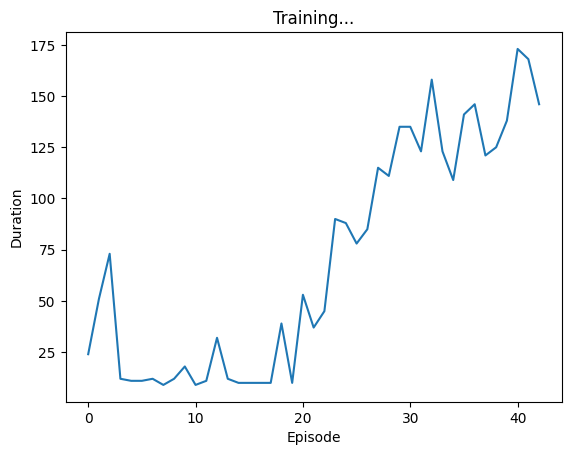

[136.0, 171.0, 166.0, 144.0, 147.0]
 Episode 43 finished after 149 steps


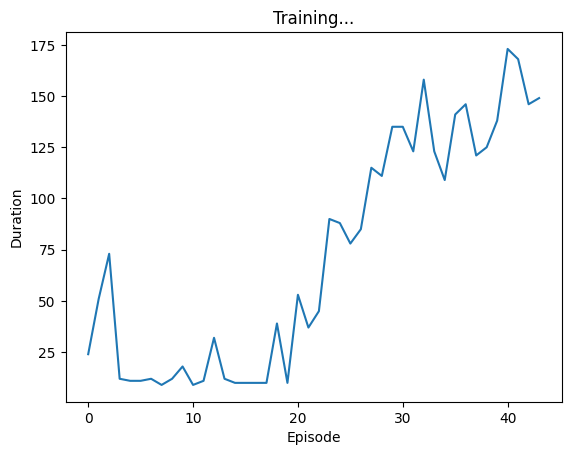

[171.0, 166.0, 144.0, 147.0, 192.0]
 Episode 44 finished after 194 steps


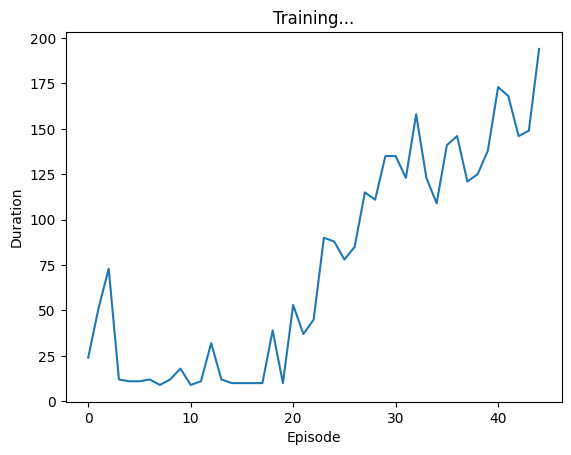

[166.0, 144.0, 147.0, 192.0, 152.0]
 Episode 45 finished after 154 steps


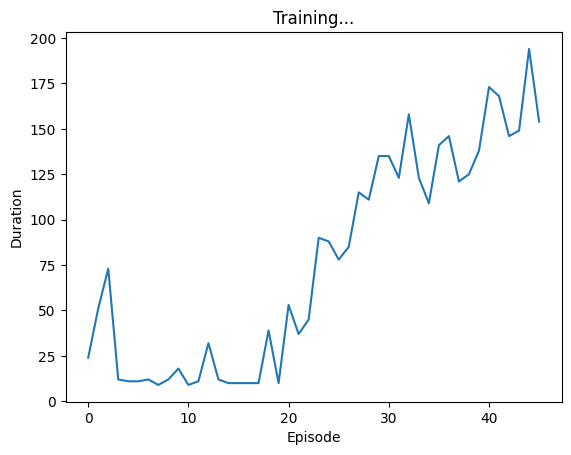

[144.0, 147.0, 192.0, 152.0, 134.0]
 Episode 46 finished after 136 steps


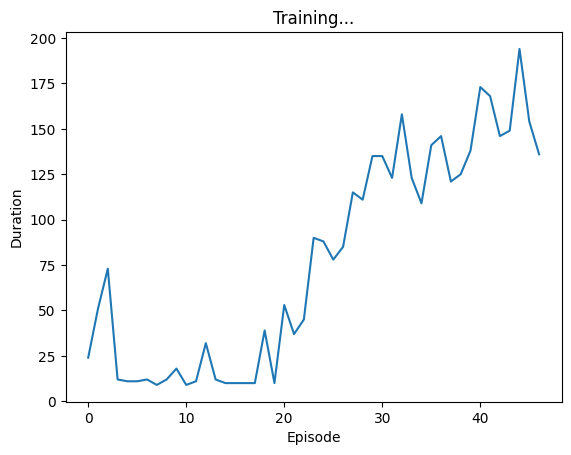

[147.0, 192.0, 152.0, 134.0, 151.0]
 Episode 47 finished after 153 steps


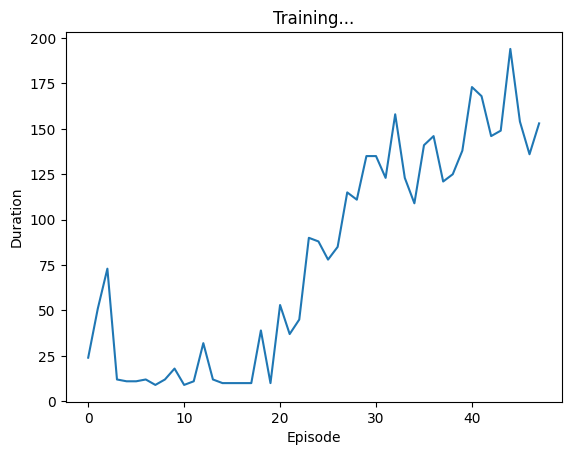

[192.0, 152.0, 134.0, 151.0, 121.0]
 Episode 48 finished after 123 steps


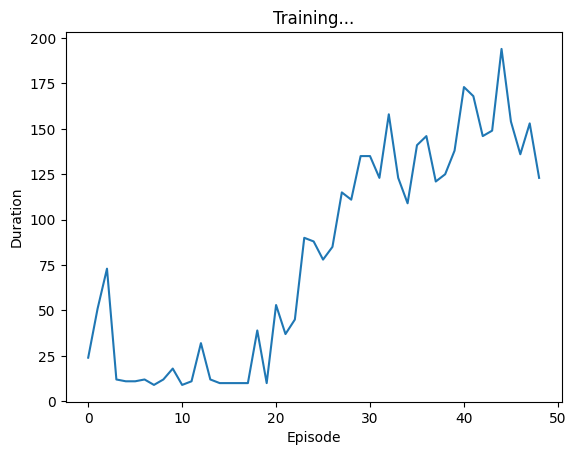

[152.0, 134.0, 151.0, 121.0, 160.0]
 Episode 49 finished after 162 steps


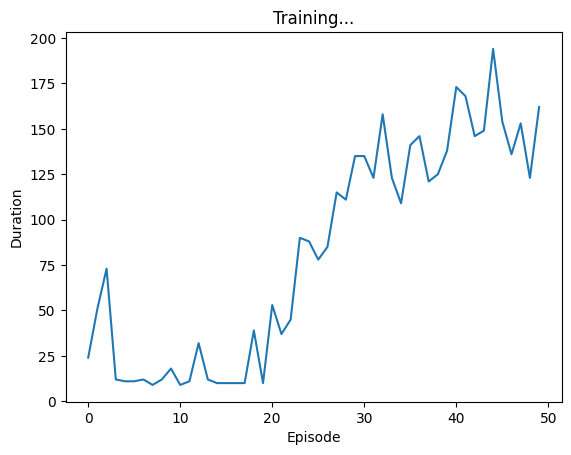

[134.0, 151.0, 121.0, 160.0, 152.0]
 Episode 50 finished after 154 steps


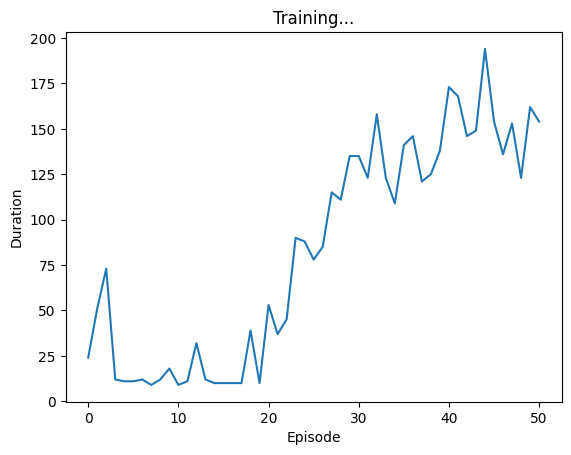

[151.0, 121.0, 160.0, 152.0, 133.0]
 Episode 51 finished after 135 steps


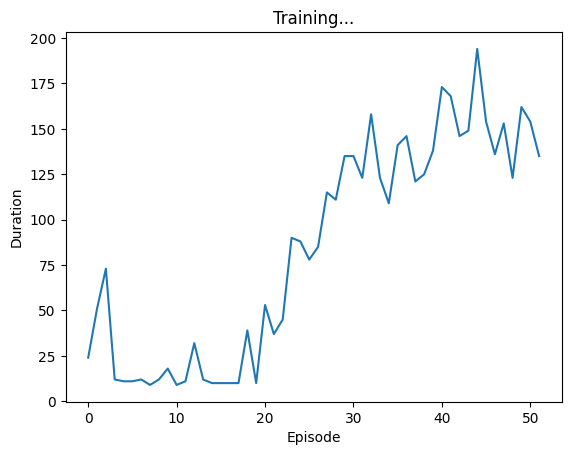

[121.0, 160.0, 152.0, 133.0, 124.0]
 Episode 52 finished after 126 steps


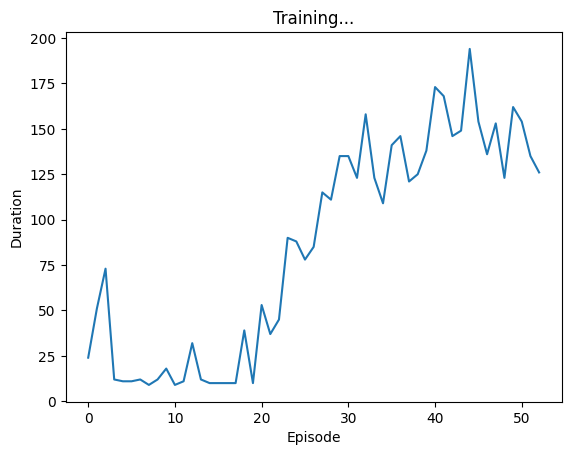

[160.0, 152.0, 133.0, 124.0, 154.0]
 Episode 53 finished after 156 steps


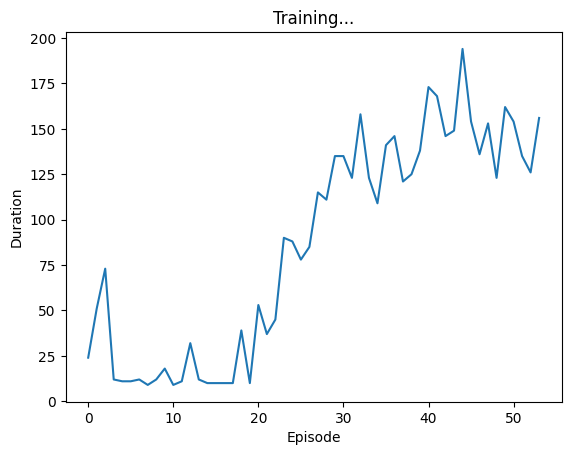

[152.0, 133.0, 124.0, 154.0, 150.0]
 Episode 54 finished after 152 steps


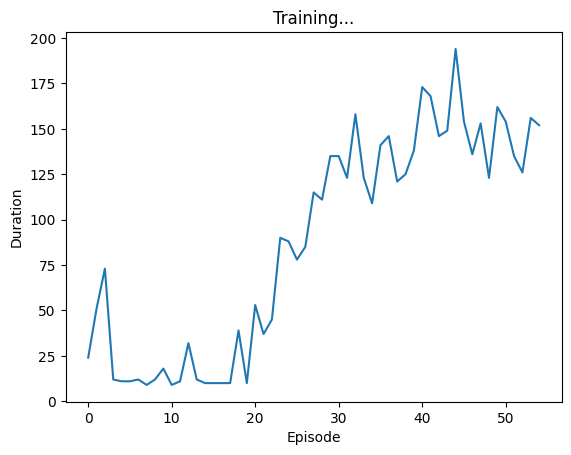

[133.0, 124.0, 154.0, 150.0, 131.0]
 Episode 55 finished after 133 steps


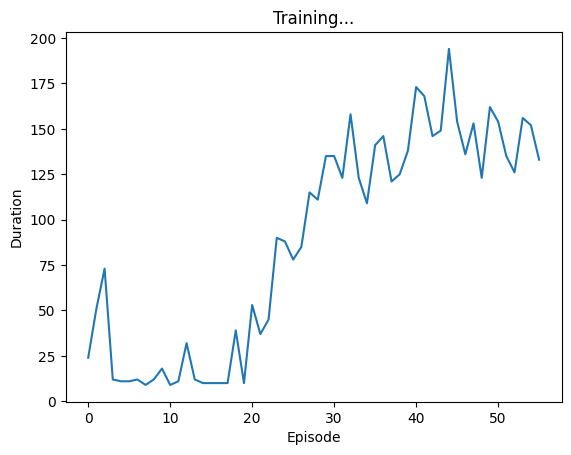

[124.0, 154.0, 150.0, 131.0, 161.0]
 Episode 56 finished after 163 steps


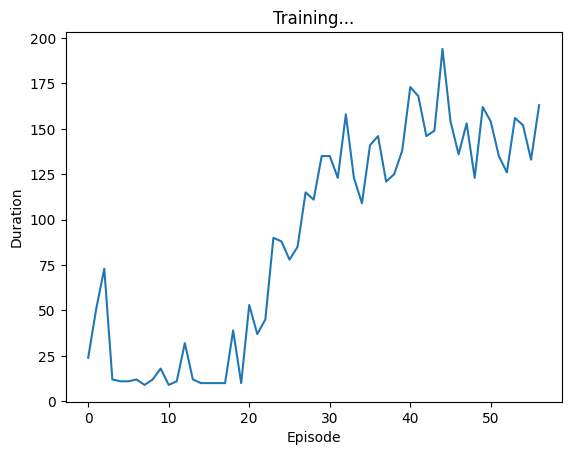

[154.0, 150.0, 131.0, 161.0, 147.0]
 Episode 57 finished after 149 steps


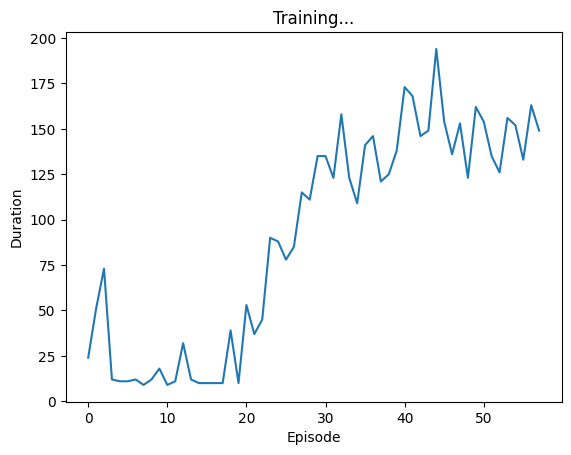

[150.0, 131.0, 161.0, 147.0, 123.0]
 Episode 58 finished after 125 steps


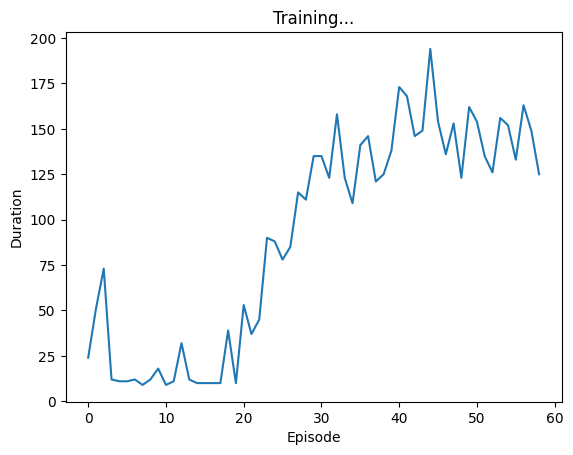

[131.0, 161.0, 147.0, 123.0, 31.0]
 Episode 59 finished after 33 steps


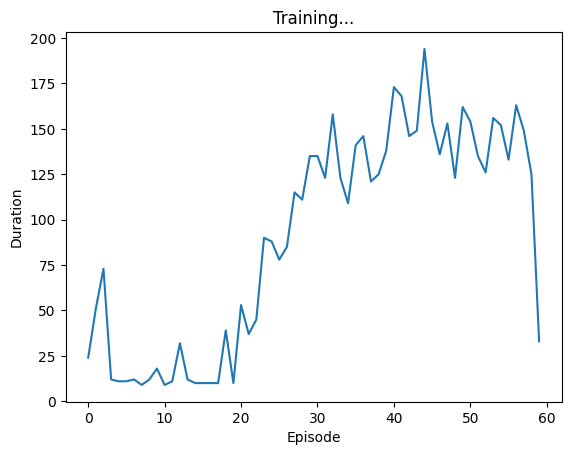

[161.0, 147.0, 123.0, 31.0, 146.0]
 Episode 60 finished after 148 steps


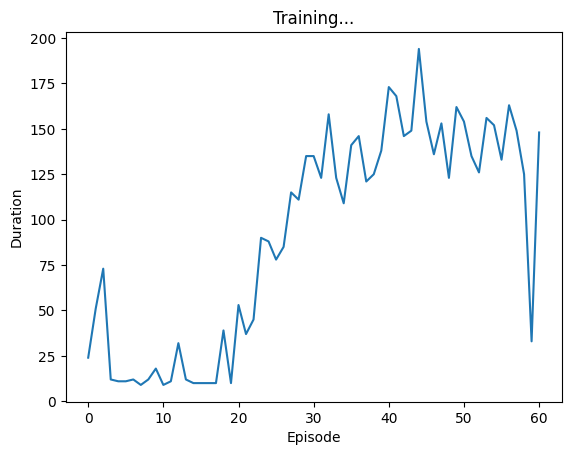

[147.0, 123.0, 31.0, 146.0, 171.0]
 Episode 61 finished after 173 steps


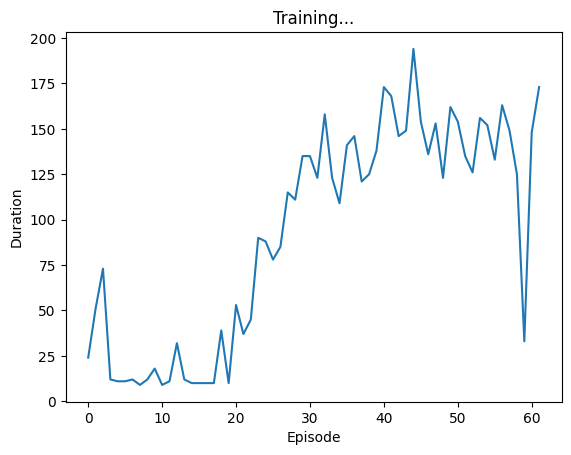

[123.0, 31.0, 146.0, 171.0, 125.0]
 Episode 62 finished after 127 steps


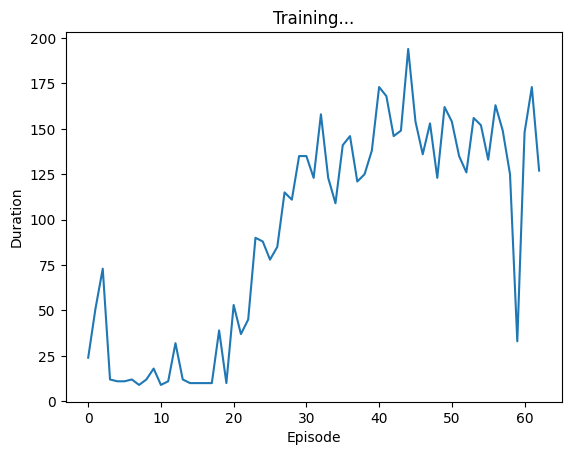

[31.0, 146.0, 171.0, 125.0, 160.0]
 Episode 63 finished after 162 steps


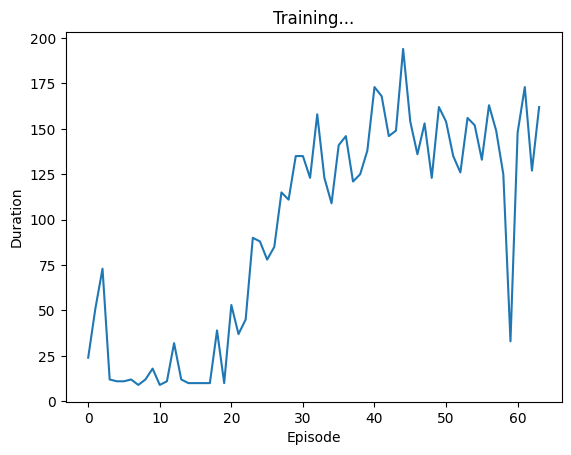

[146.0, 171.0, 125.0, 160.0, 187.0]
 Episode 64 finished after 189 steps


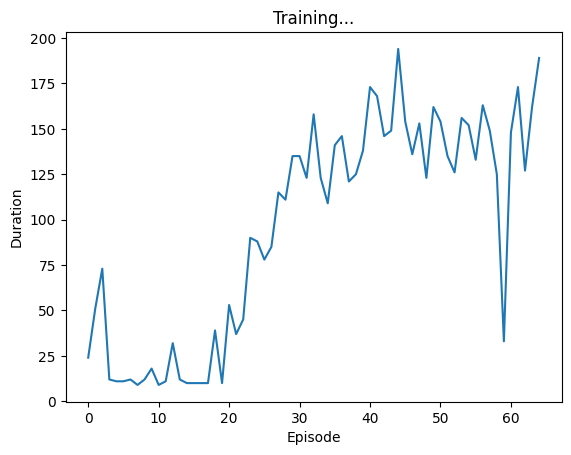

[171.0, 125.0, 160.0, 187.0, 128.0]
 Episode 65 finished after 130 steps


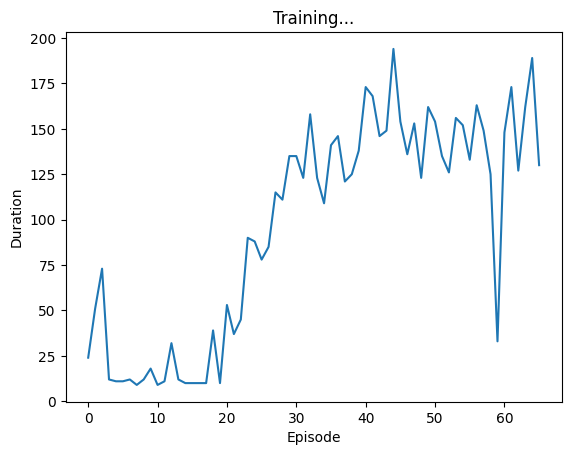

[125.0, 160.0, 187.0, 128.0, 161.0]
 Episode 66 finished after 163 steps


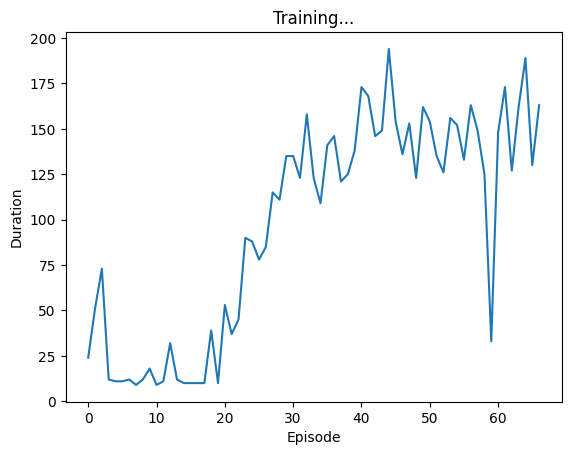

[160.0, 187.0, 128.0, 161.0, 154.0]
 Episode 67 finished after 156 steps


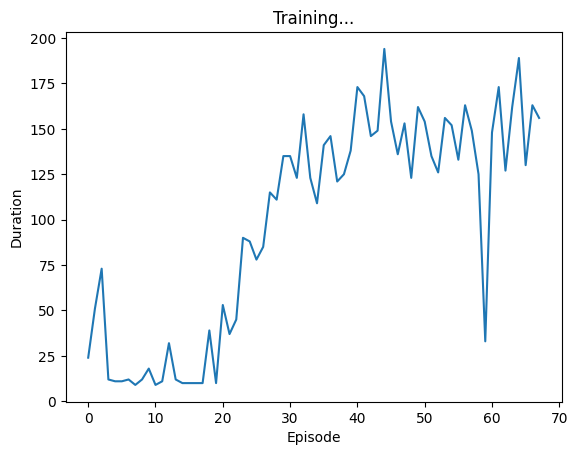

[187.0, 128.0, 161.0, 154.0, 135.0]
 Episode 68 finished after 137 steps


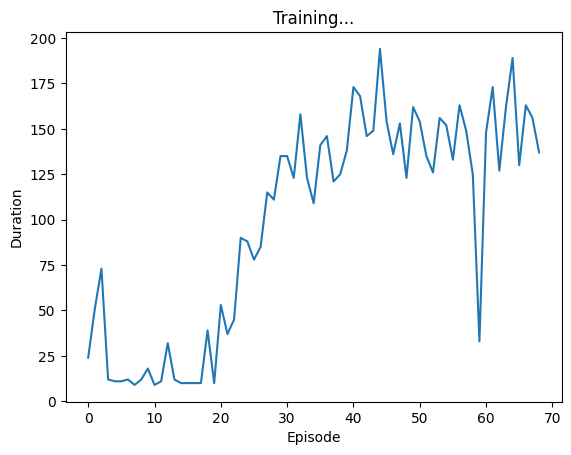

[128.0, 161.0, 154.0, 135.0, 150.0]
 Episode 69 finished after 152 steps


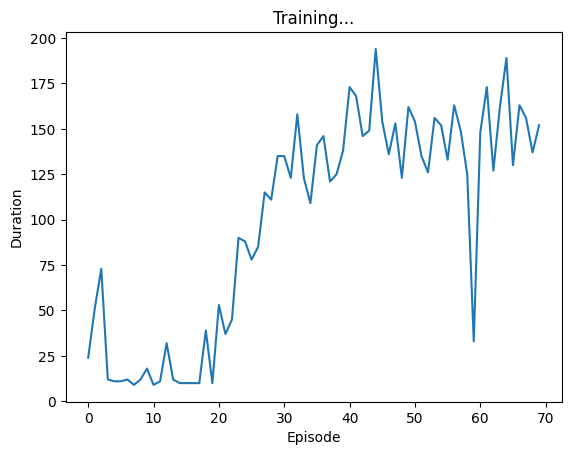

[161.0, 154.0, 135.0, 150.0, 136.0]
 Episode 70 finished after 138 steps


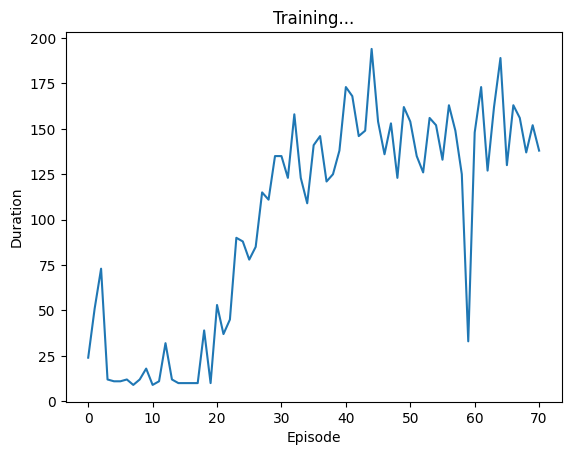

[154.0, 135.0, 150.0, 136.0, 162.0]
 Episode 71 finished after 164 steps


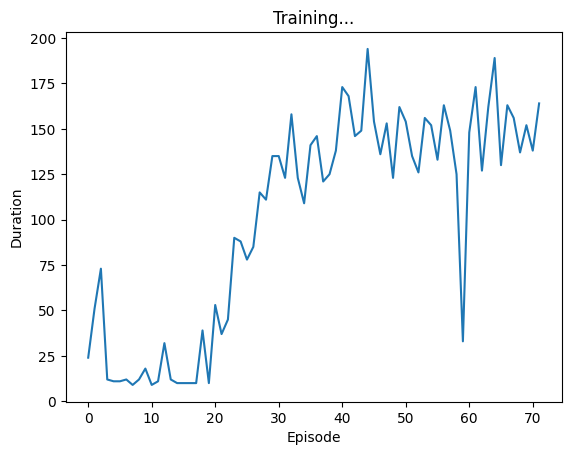

[135.0, 150.0, 136.0, 162.0, 152.0]
 Episode 72 finished after 154 steps


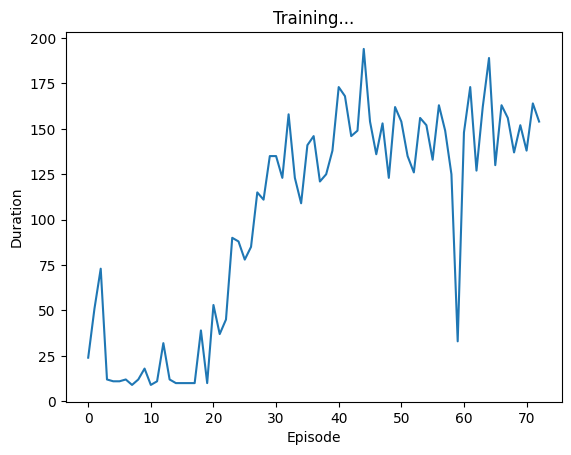

[150.0, 136.0, 162.0, 152.0, 136.0]
 Episode 73 finished after 138 steps


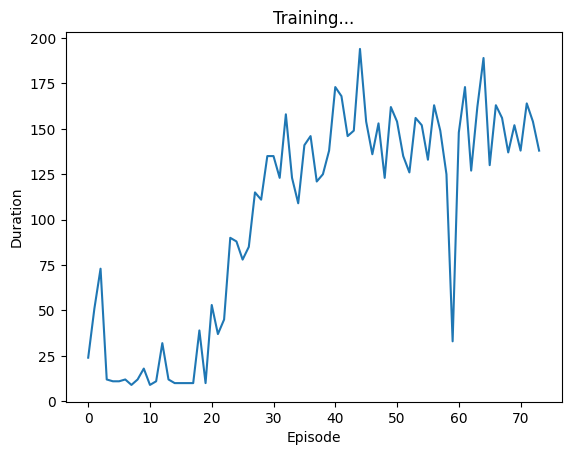

[136.0, 162.0, 152.0, 136.0, 145.0]
 Episode 74 finished after 147 steps


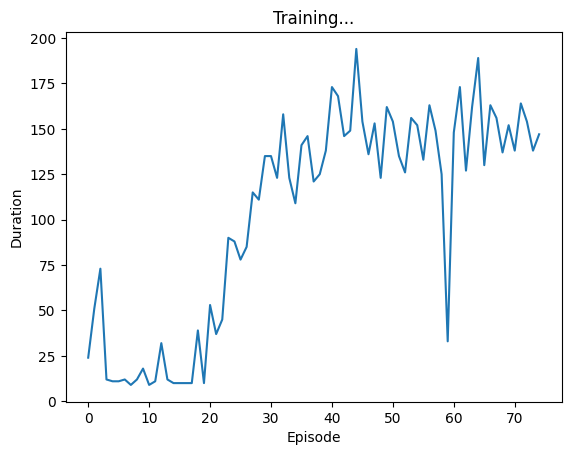

[162.0, 152.0, 136.0, 145.0, 149.0]
 Episode 75 finished after 151 steps


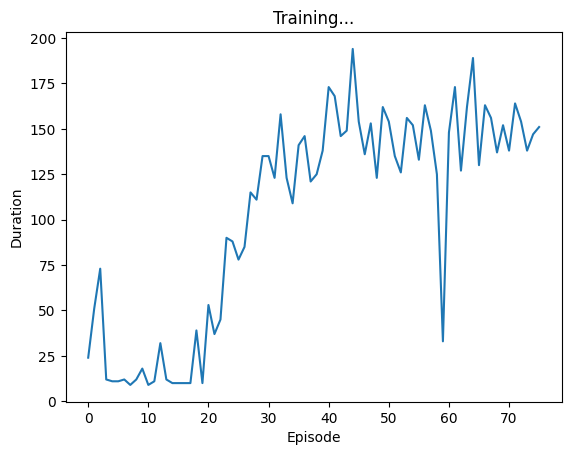

[152.0, 136.0, 145.0, 149.0, 152.0]
 Episode 76 finished after 154 steps


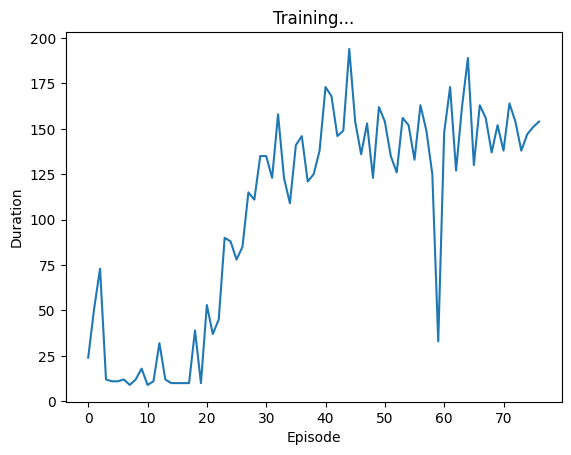

[136.0, 145.0, 149.0, 152.0, 132.0]
 Episode 77 finished after 134 steps


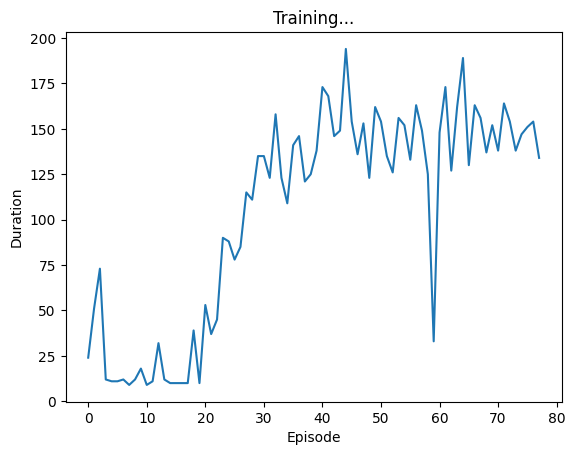

[145.0, 149.0, 152.0, 132.0, 160.0]
 Episode 78 finished after 162 steps


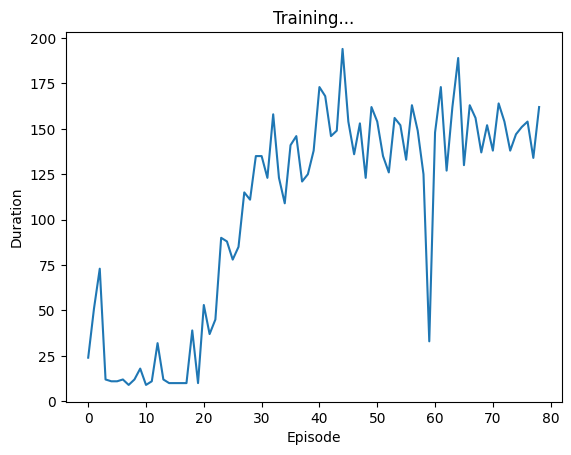

[149.0, 152.0, 132.0, 160.0, 137.0]
 Episode 79 finished after 139 steps


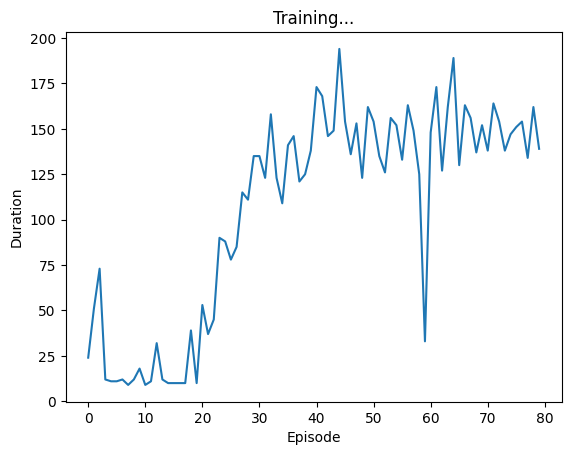

[152.0, 132.0, 160.0, 137.0, 157.0]
 Episode 80 finished after 159 steps


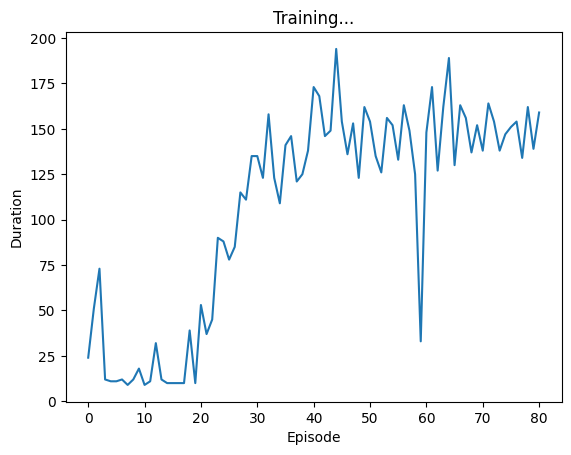

[132.0, 160.0, 137.0, 157.0, 169.0]
 Episode 81 finished after 171 steps


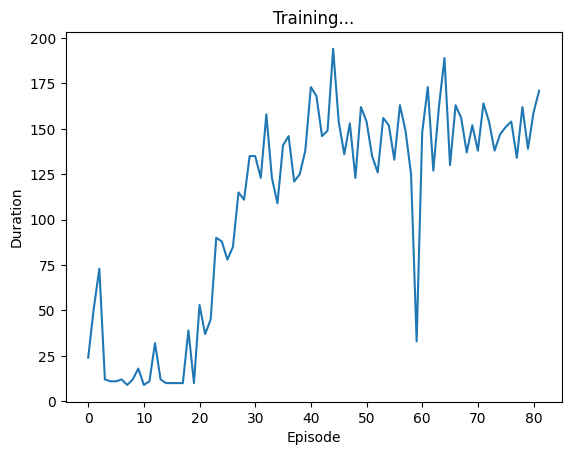

[160.0, 137.0, 157.0, 169.0, 137.0]
 Episode 82 finished after 139 steps


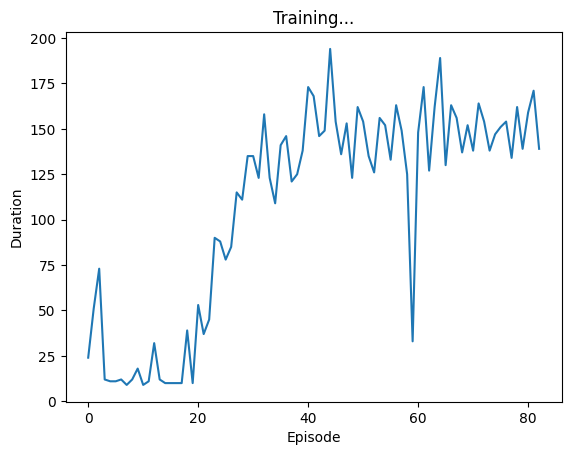

[137.0, 157.0, 169.0, 137.0, 132.0]
 Episode 83 finished after 134 steps


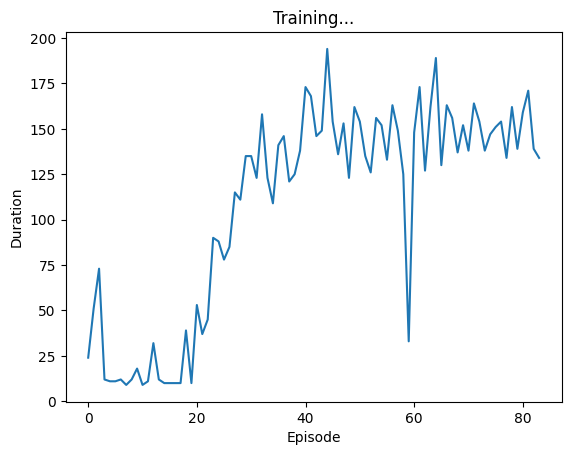

[157.0, 169.0, 137.0, 132.0, 131.0]
 Episode 84 finished after 133 steps


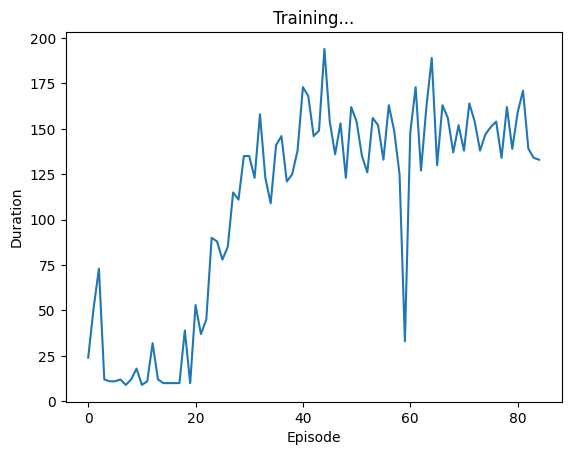

[169.0, 137.0, 132.0, 131.0, 173.0]
 Episode 85 finished after 175 steps


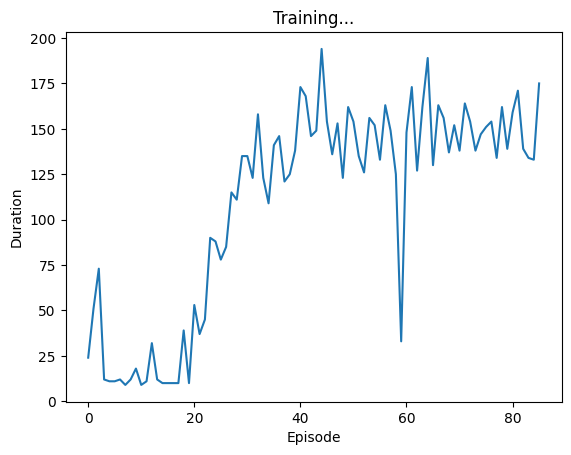

[137.0, 132.0, 131.0, 173.0, 138.0]
 Episode 86 finished after 140 steps


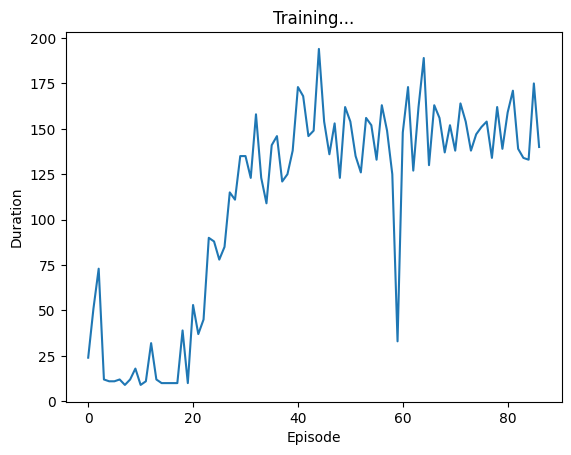

[132.0, 131.0, 173.0, 138.0, 148.0]
 Episode 87 finished after 150 steps


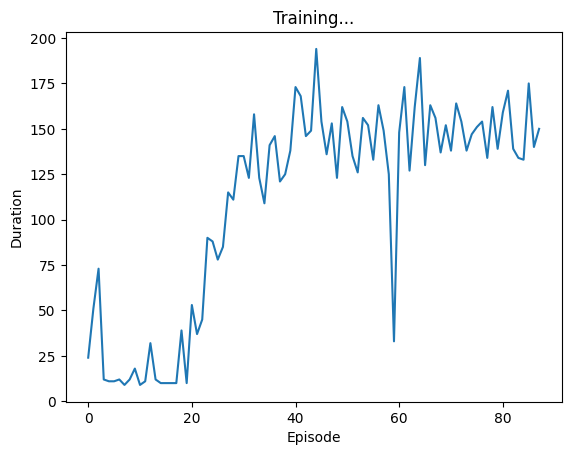

[131.0, 173.0, 138.0, 148.0, 160.0]
 Episode 88 finished after 162 steps


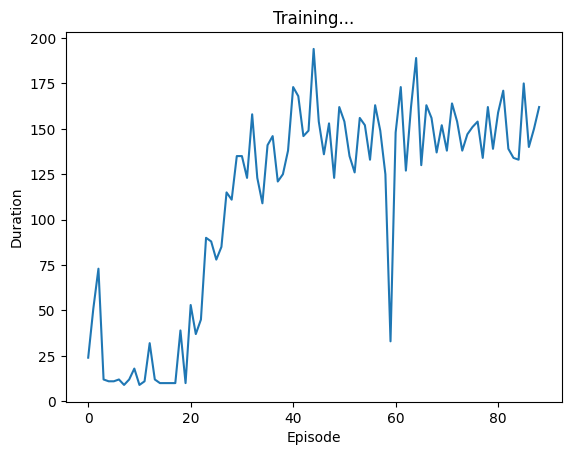

[173.0, 138.0, 148.0, 160.0, 145.0]
 Episode 89 finished after 147 steps


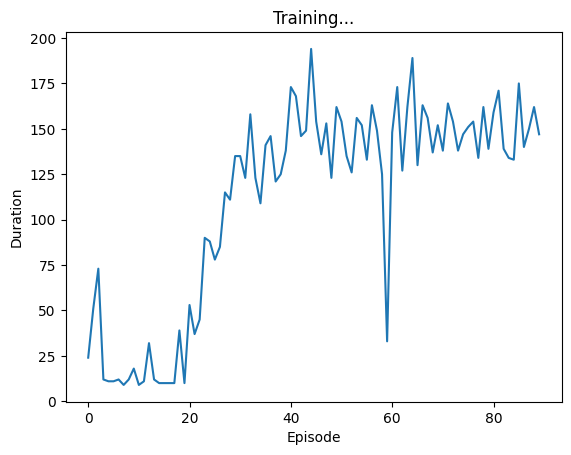

[138.0, 148.0, 160.0, 145.0, 138.0]
 Episode 90 finished after 140 steps


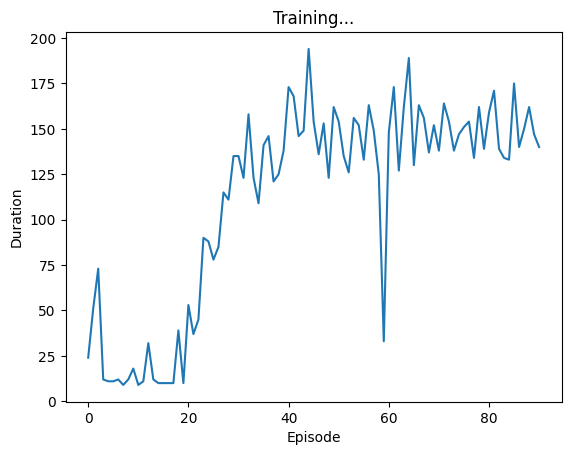

[148.0, 160.0, 145.0, 138.0, 11.0]
 Episode 91 finished after 13 steps


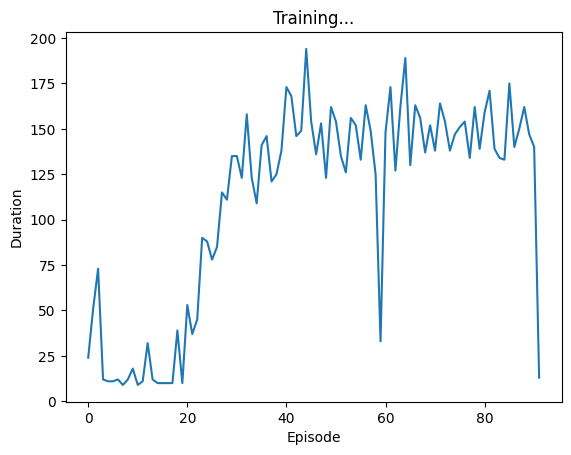

[160.0, 145.0, 138.0, 11.0, 156.0]
 Episode 92 finished after 158 steps


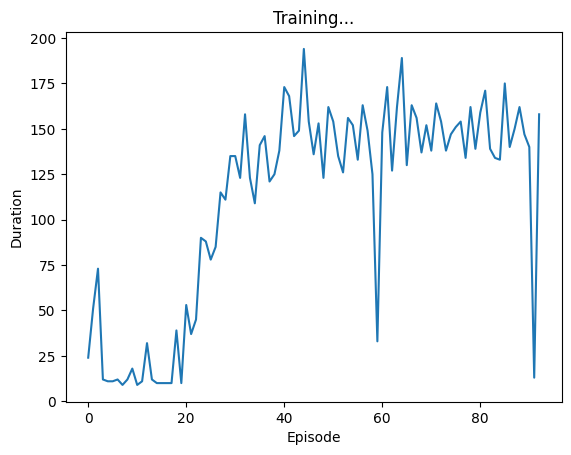

[145.0, 138.0, 11.0, 156.0, 74.0]
 Episode 93 finished after 76 steps


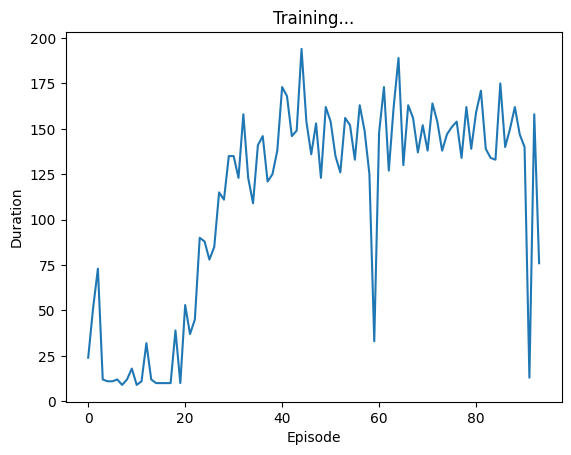

[138.0, 11.0, 156.0, 74.0, 159.0]
 Episode 94 finished after 161 steps


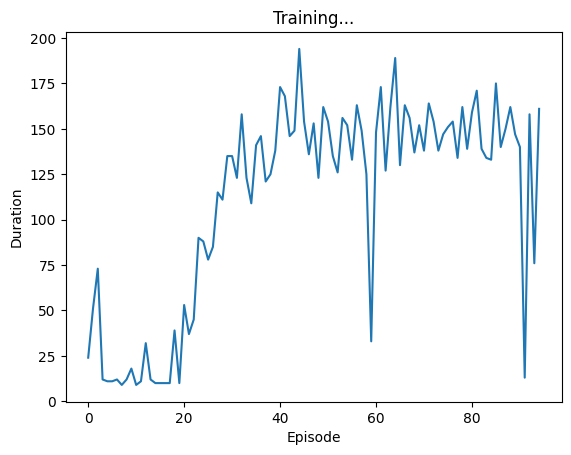

[11.0, 156.0, 74.0, 159.0, 145.0]
 Episode 95 finished after 147 steps


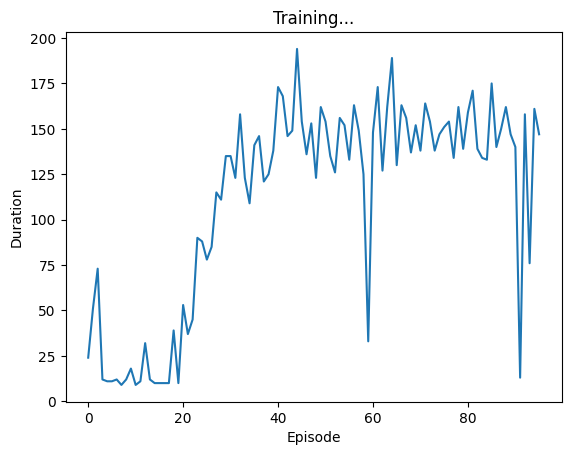

[156.0, 74.0, 159.0, 145.0, 169.0]
 Episode 96 finished after 171 steps


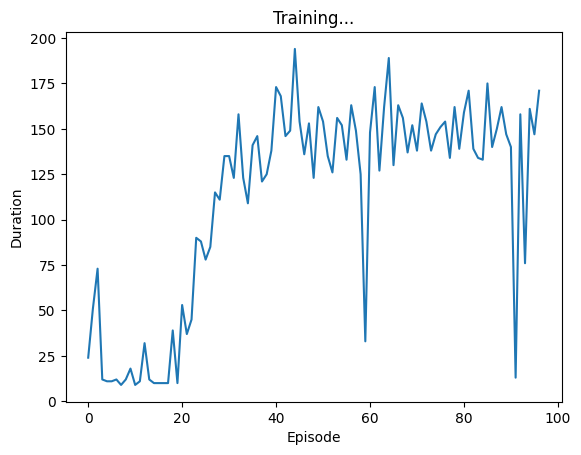

[74.0, 159.0, 145.0, 169.0, 198.0]
 Episode 97 finished after 200 steps


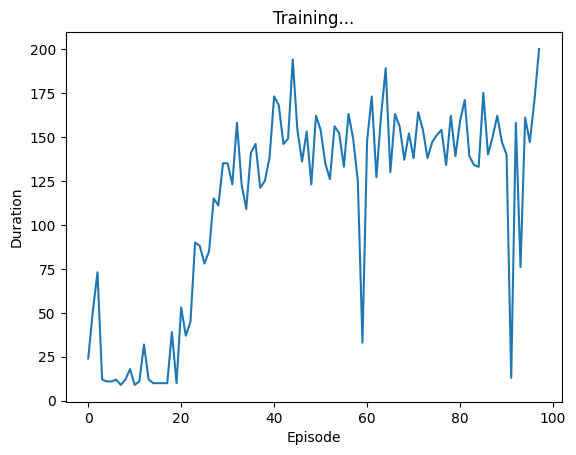

[159.0, 145.0, 169.0, 198.0, 185.0]
 Episode 98 finished after 187 steps


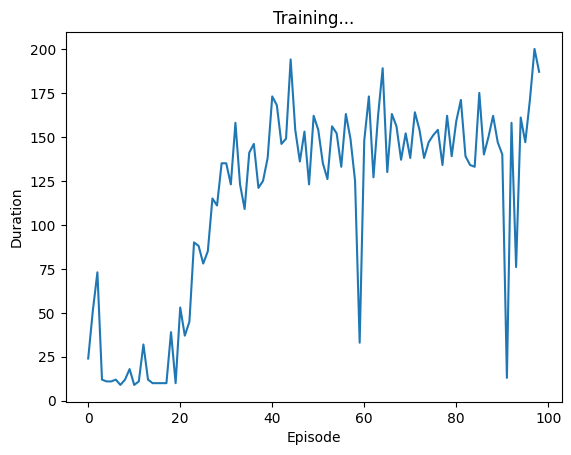

[145.0, 169.0, 198.0, 185.0, 169.0]
 Episode 99 finished after 171 steps


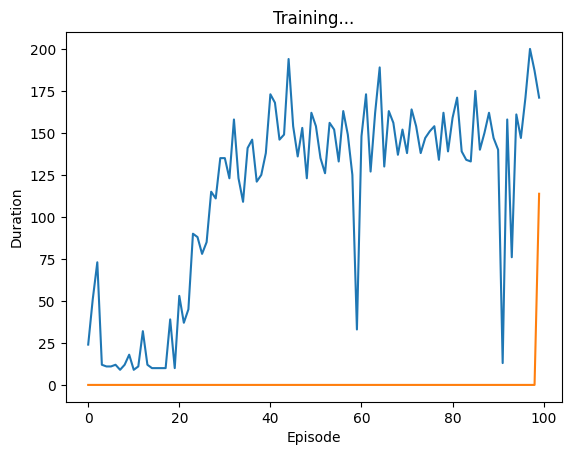

[169.0, 198.0, 185.0, 169.0, 162.0]
 Episode 100 finished after 164 steps


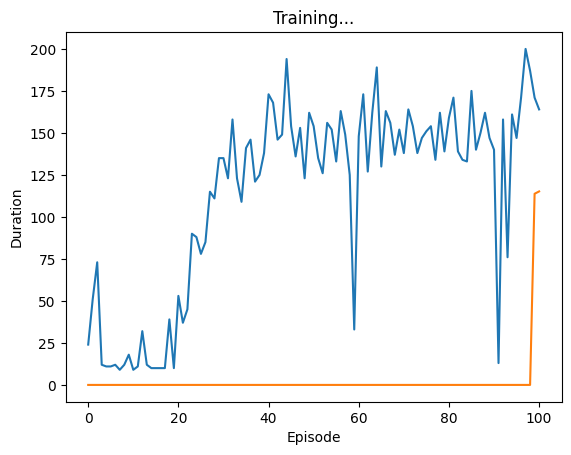

[198.0, 185.0, 169.0, 162.0, 164.0]
 Episode 101 finished after 166 steps


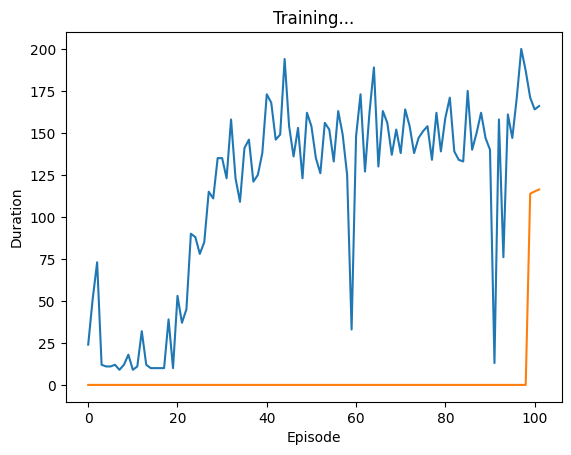

[185.0, 169.0, 162.0, 164.0, 189.0]
 Episode 102 finished after 191 steps


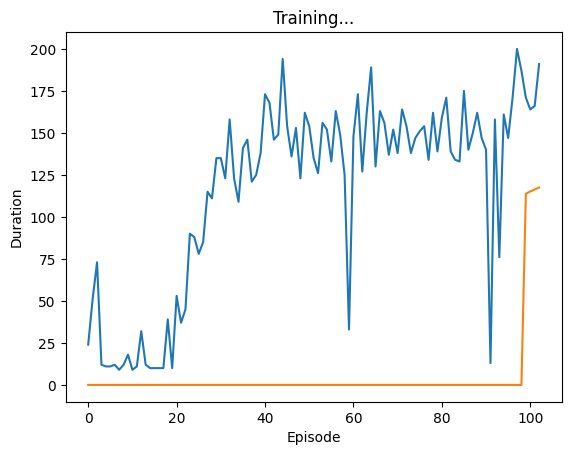

[169.0, 162.0, 164.0, 189.0, 149.0]
 Episode 103 finished after 151 steps


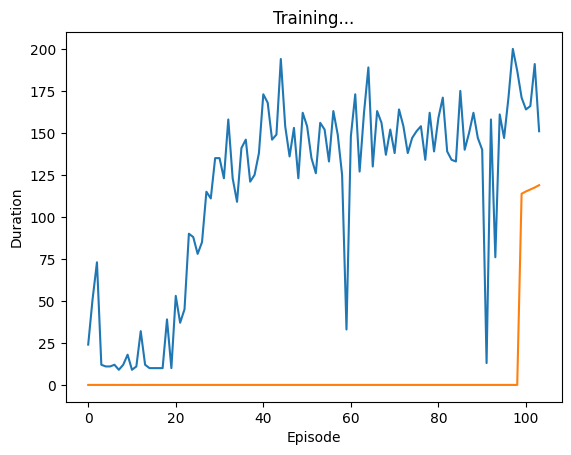

[162.0, 164.0, 189.0, 149.0, 24.0]
 Episode 104 finished after 26 steps


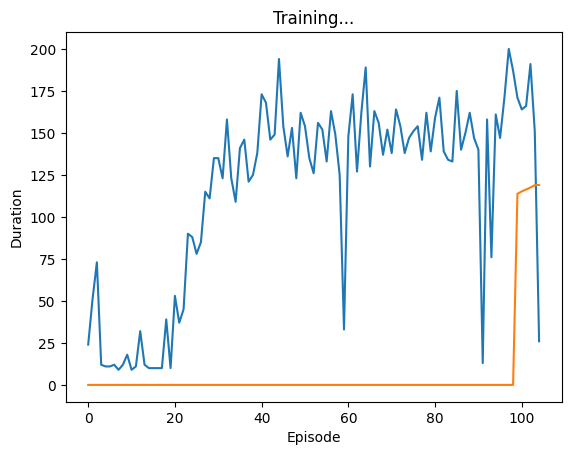

[164.0, 189.0, 149.0, 24.0, 163.0]
 Episode 105 finished after 165 steps


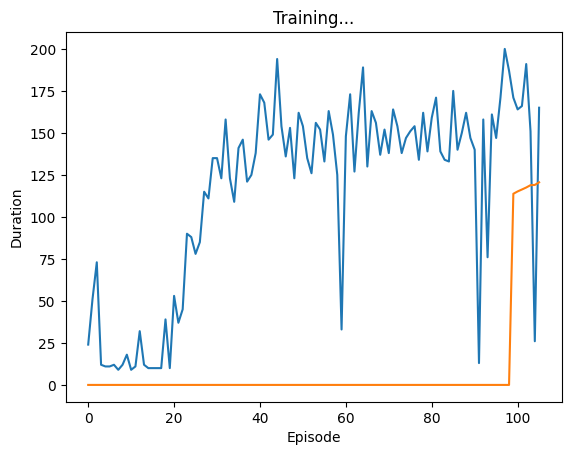

[189.0, 149.0, 24.0, 163.0, 156.0]
 Episode 106 finished after 158 steps


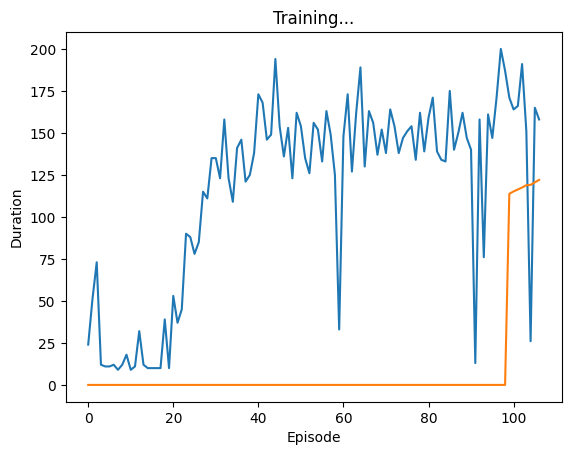

[149.0, 24.0, 163.0, 156.0, 43.0]
 Episode 107 finished after 45 steps


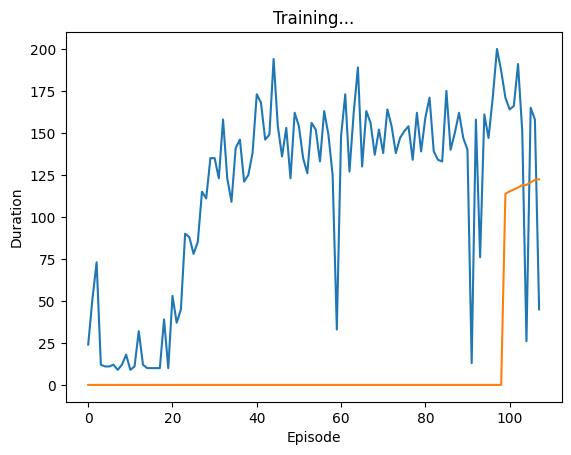

[24.0, 163.0, 156.0, 43.0, 198.0]
 Episode 108 finished after 200 steps


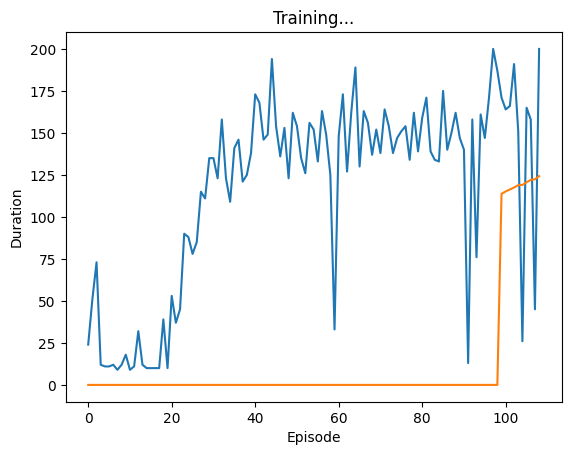

[163.0, 156.0, 43.0, 198.0, 147.0]
 Episode 109 finished after 149 steps


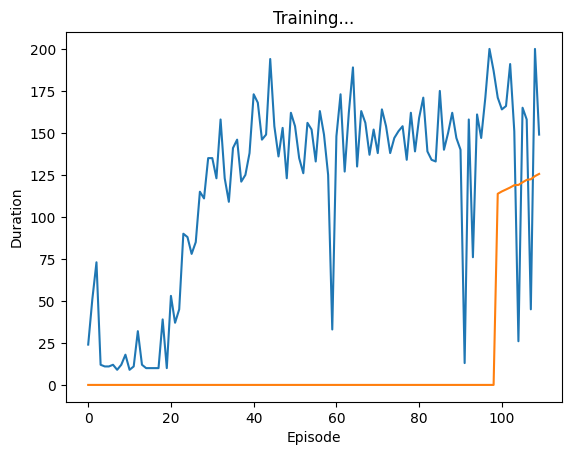

[156.0, 43.0, 198.0, 147.0, 166.0]
 Episode 110 finished after 168 steps


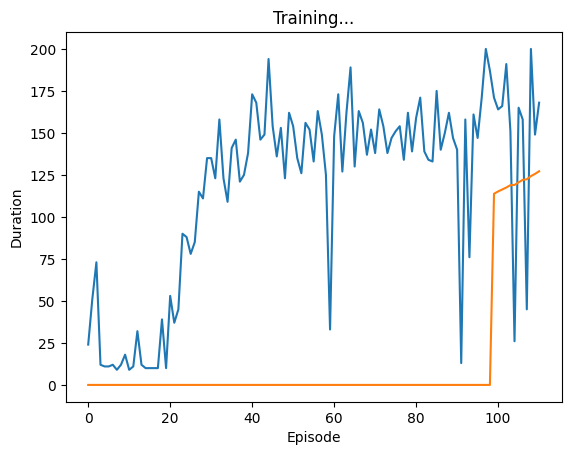

[43.0, 198.0, 147.0, 166.0, 128.0]
 Episode 111 finished after 130 steps


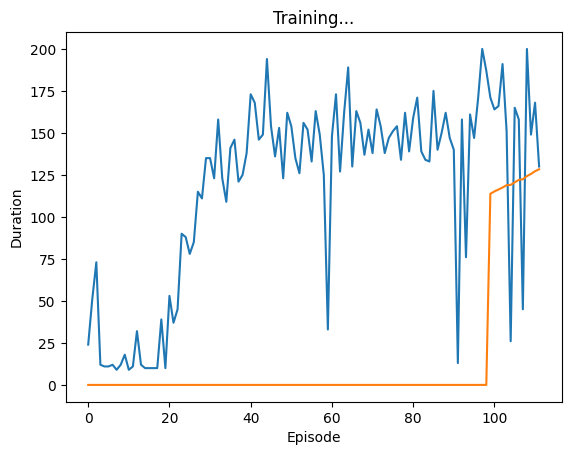

[198.0, 147.0, 166.0, 128.0, 197.0]
 Episode 112 finished after 199 steps


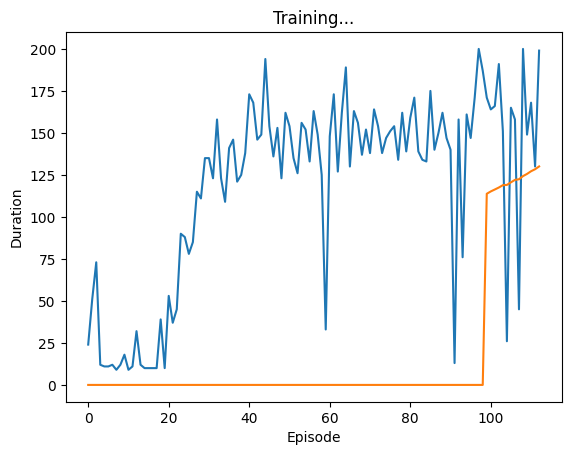

[147.0, 166.0, 128.0, 197.0, 196.0]
 Episode 113 finished after 198 steps


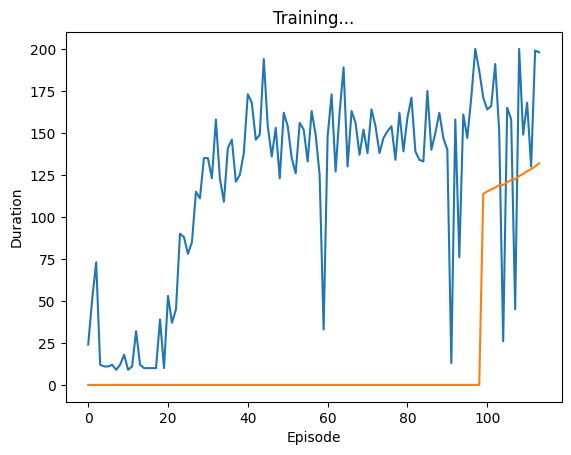

[166.0, 128.0, 197.0, 196.0, 143.0]
 Episode 114 finished after 145 steps


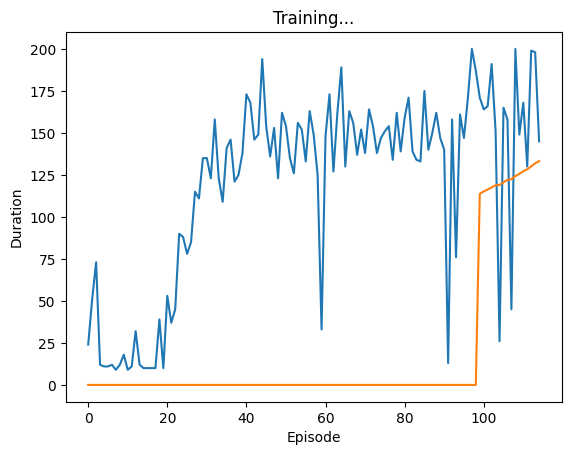

[128.0, 197.0, 196.0, 143.0, 128.0]
 Episode 115 finished after 130 steps


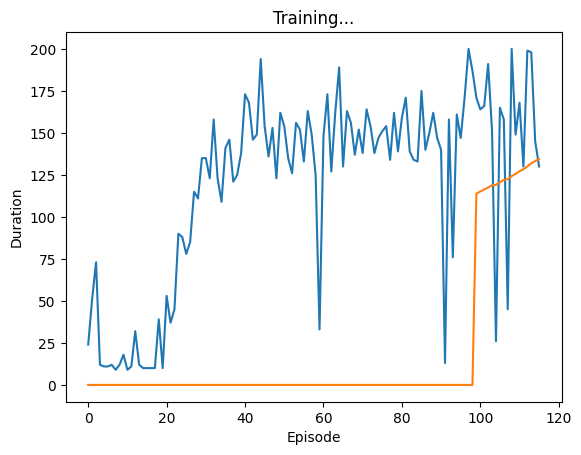

[197.0, 196.0, 143.0, 128.0, 122.0]
 Episode 116 finished after 124 steps


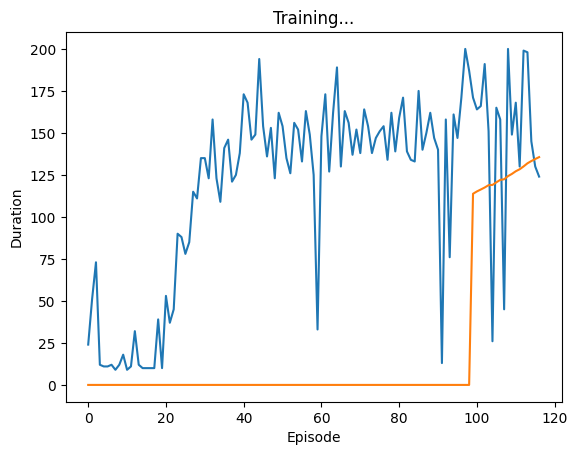

[196.0, 143.0, 128.0, 122.0, 198.0]
 Episode 117 finished after 200 steps


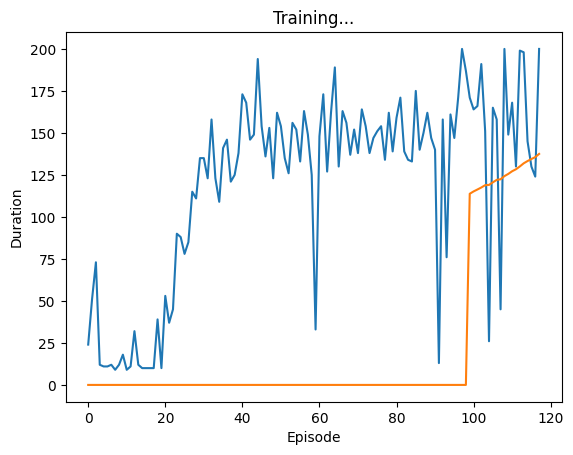

[143.0, 128.0, 122.0, 198.0, 79.0]
 Episode 118 finished after 81 steps


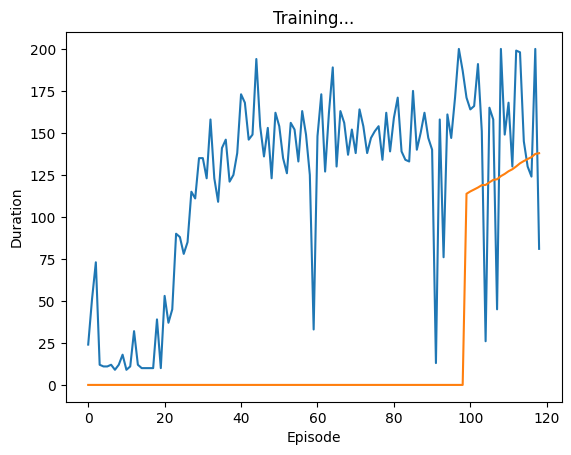

[128.0, 122.0, 198.0, 79.0, 154.0]
 Episode 119 finished after 156 steps


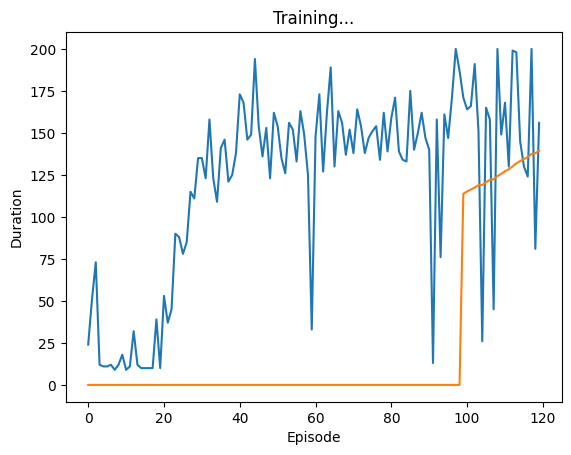

[122.0, 198.0, 79.0, 154.0, 18.0]
 Episode 120 finished after 20 steps


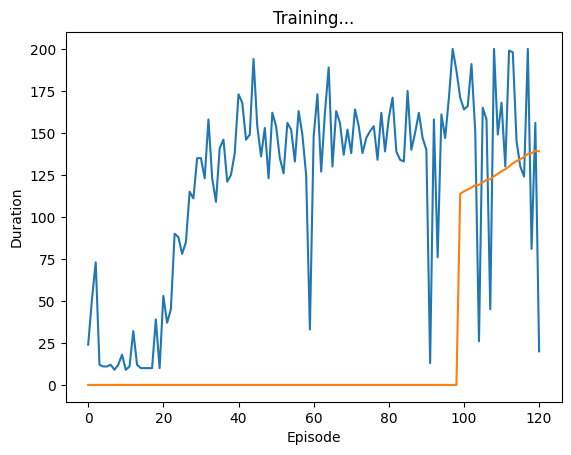

[198.0, 79.0, 154.0, 18.0, 13.0]
 Episode 121 finished after 15 steps


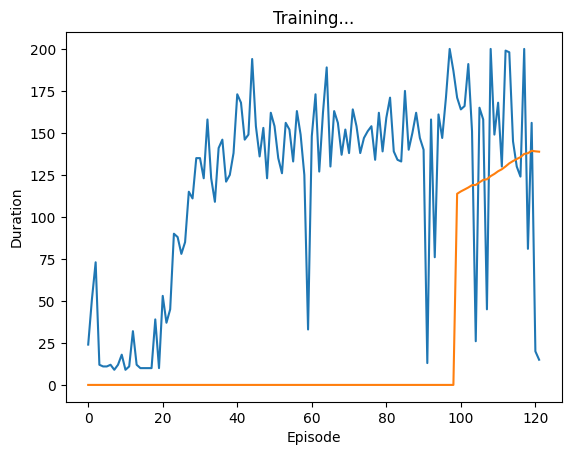

[79.0, 154.0, 18.0, 13.0, 198.0]
 Episode 122 finished after 200 steps


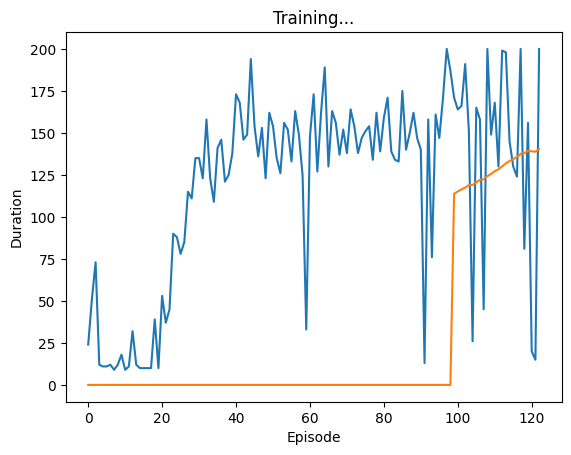

[154.0, 18.0, 13.0, 198.0, 95.0]
 Episode 123 finished after 97 steps


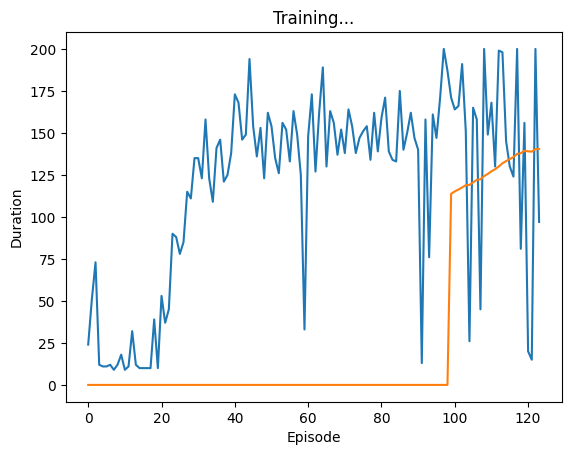

[18.0, 13.0, 198.0, 95.0, 143.0]
 Episode 124 finished after 145 steps


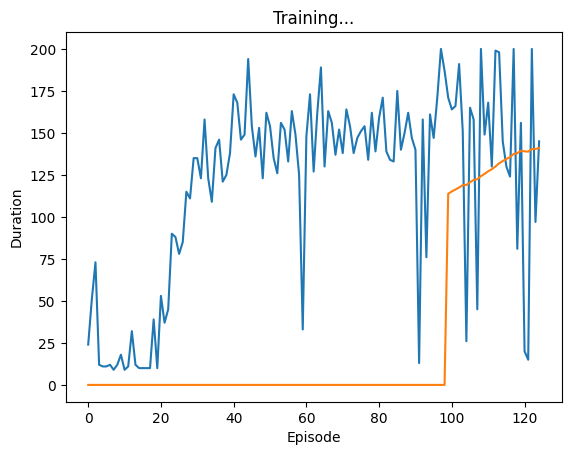

[13.0, 198.0, 95.0, 143.0, 18.0]
 Episode 125 finished after 20 steps


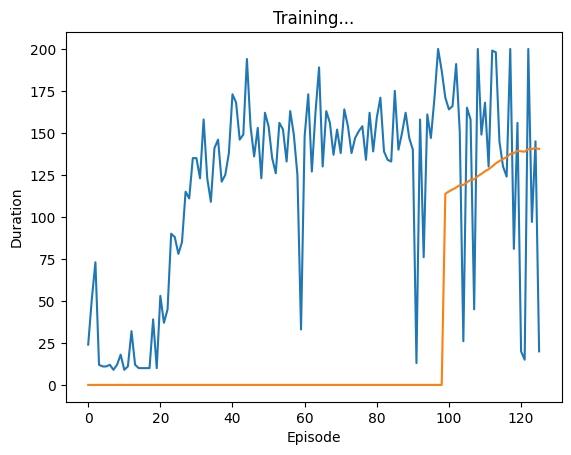

[198.0, 95.0, 143.0, 18.0, 144.0]
 Episode 126 finished after 146 steps


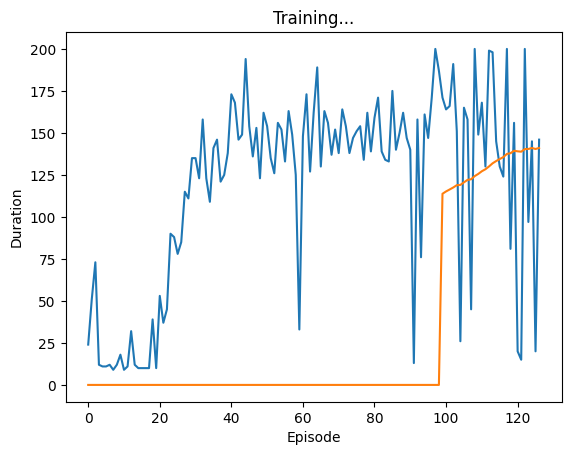

[95.0, 143.0, 18.0, 144.0, 168.0]
 Episode 127 finished after 170 steps


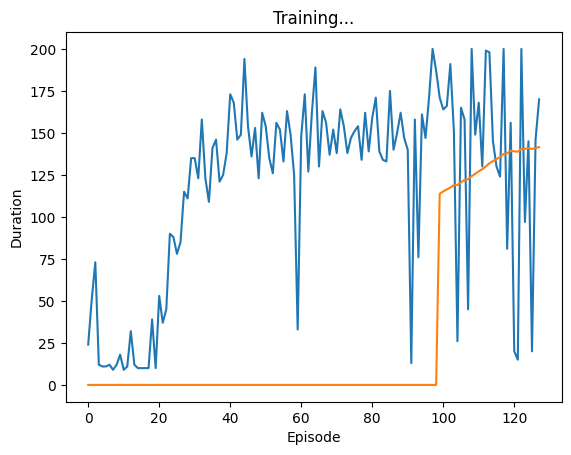

[143.0, 18.0, 144.0, 168.0, 102.0]
 Episode 128 finished after 104 steps


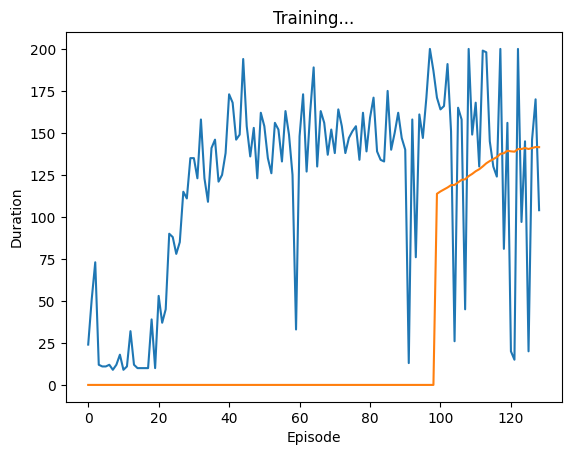

[18.0, 144.0, 168.0, 102.0, 138.0]
 Episode 129 finished after 140 steps


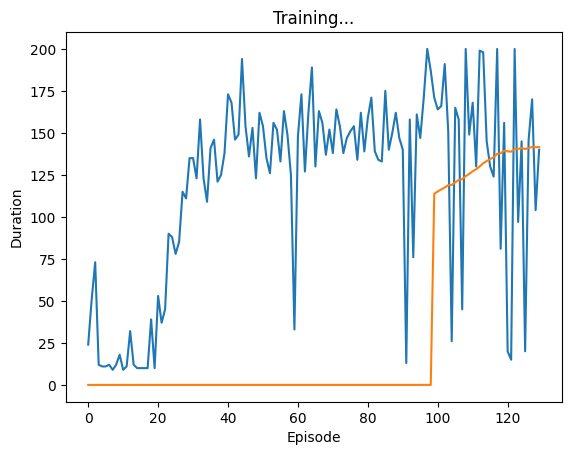

[144.0, 168.0, 102.0, 138.0, 198.0]
 Episode 130 finished after 200 steps


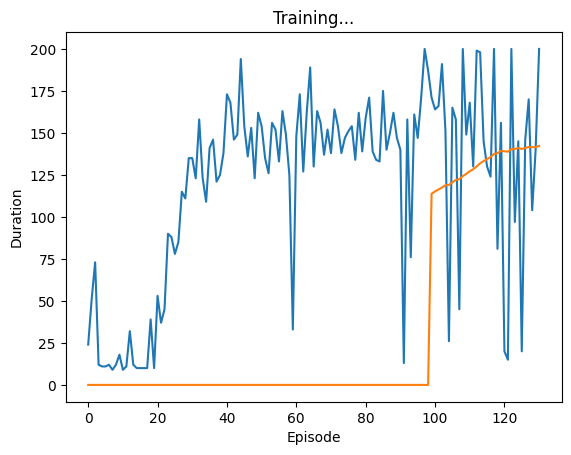

[168.0, 102.0, 138.0, 198.0, 172.0]
 Episode 131 finished after 174 steps


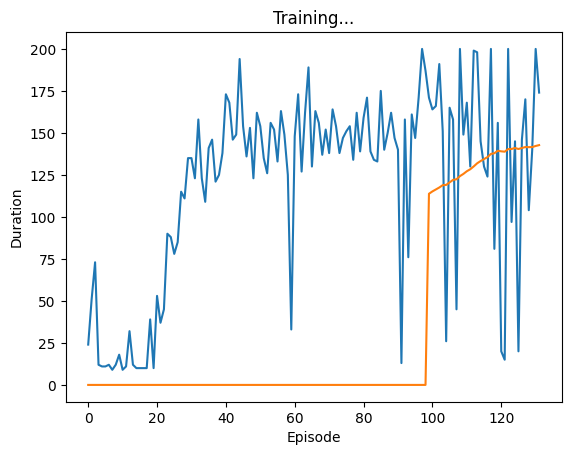

[102.0, 138.0, 198.0, 172.0, 130.0]
 Episode 132 finished after 132 steps


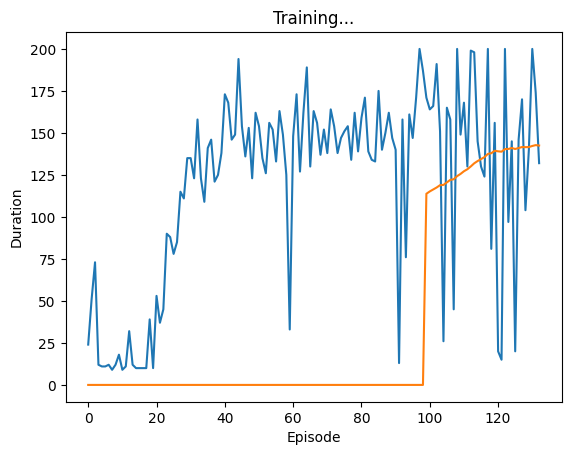

[138.0, 198.0, 172.0, 130.0, 96.0]
 Episode 133 finished after 98 steps


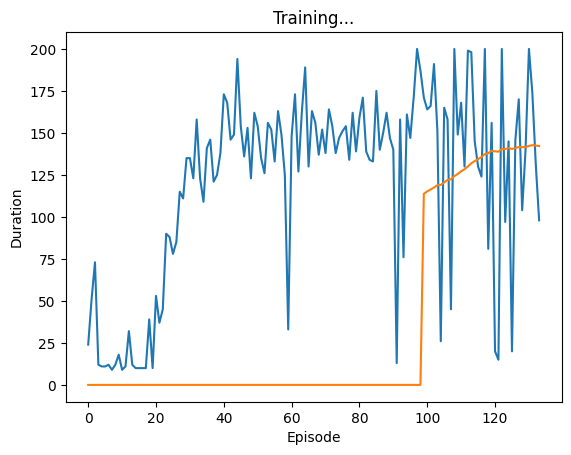

[198.0, 172.0, 130.0, 96.0, 175.0]
 Episode 134 finished after 177 steps


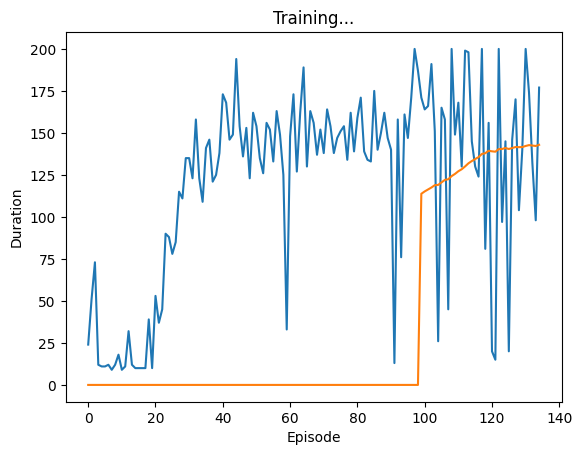

[172.0, 130.0, 96.0, 175.0, 198.0]
 Episode 135 finished after 200 steps


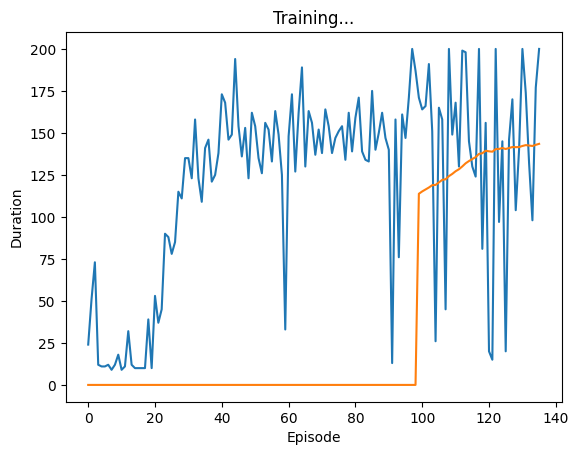

[130.0, 96.0, 175.0, 198.0, 168.0]
 Episode 136 finished after 170 steps


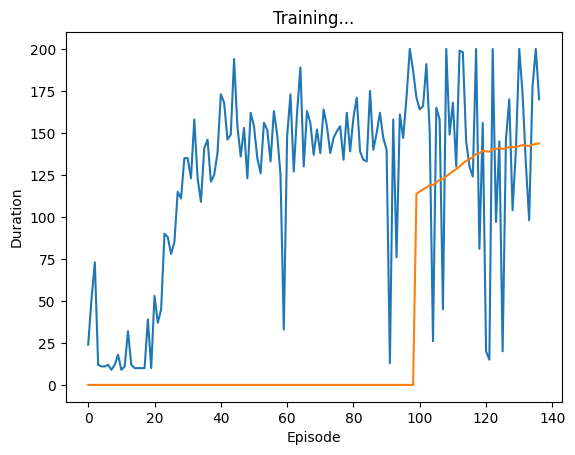

[96.0, 175.0, 198.0, 168.0, 154.0]
 Episode 137 finished after 156 steps


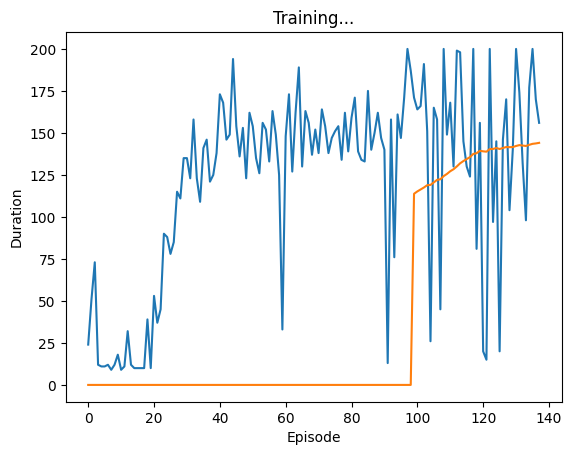

[175.0, 198.0, 168.0, 154.0, 167.0]
 Episode 138 finished after 169 steps


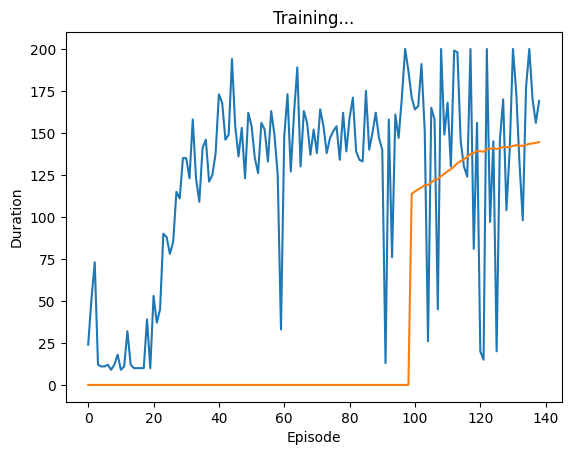

[198.0, 168.0, 154.0, 167.0, 187.0]
 Episode 139 finished after 189 steps


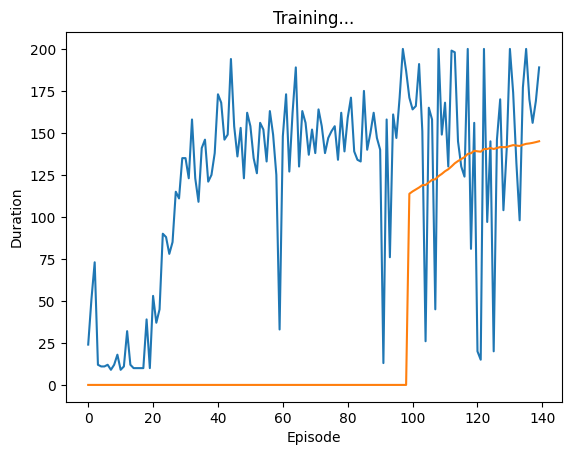

[168.0, 154.0, 167.0, 187.0, 178.0]
 Episode 140 finished after 180 steps


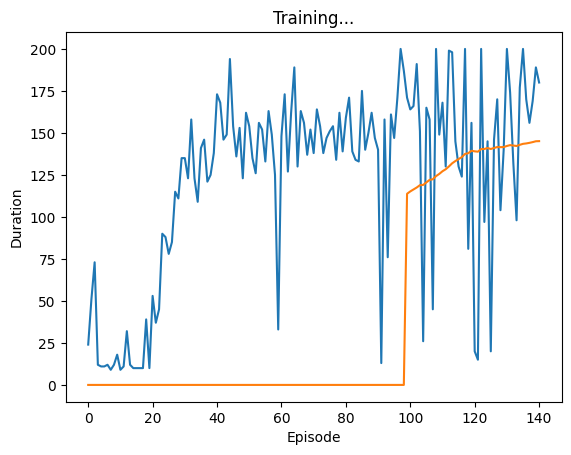

[154.0, 167.0, 187.0, 178.0, 124.0]
 Episode 141 finished after 126 steps


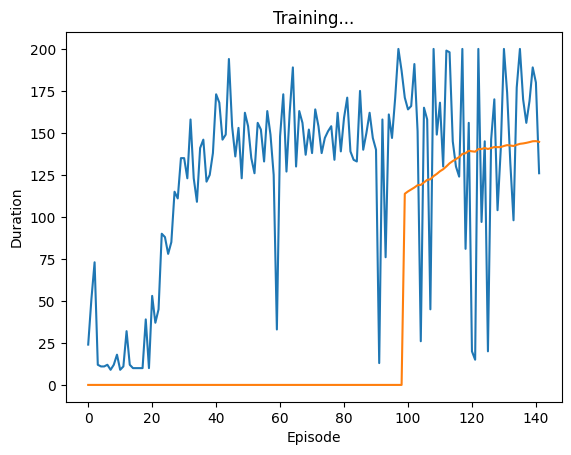

[167.0, 187.0, 178.0, 124.0, 198.0]
 Episode 142 finished after 200 steps


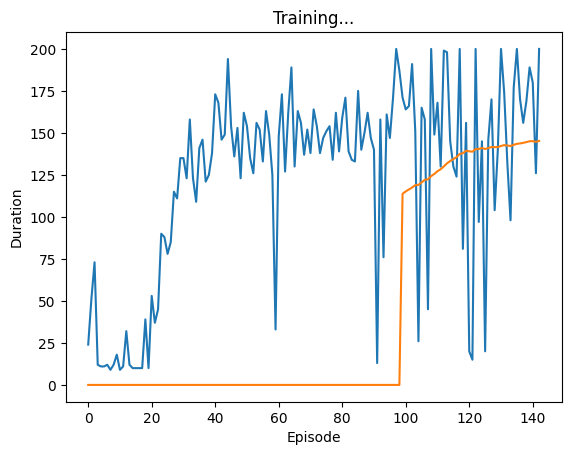

[187.0, 178.0, 124.0, 198.0, 65.0]
 Episode 143 finished after 67 steps


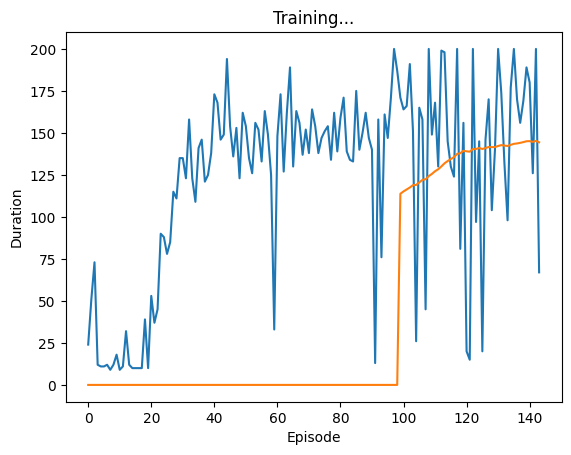

[178.0, 124.0, 198.0, 65.0, 198.0]
 Episode 144 finished after 200 steps


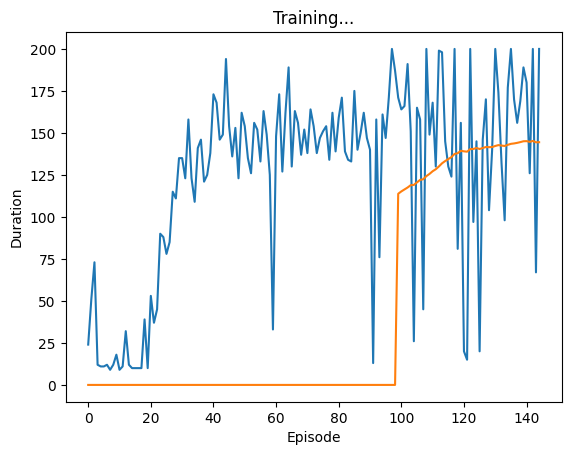

[124.0, 198.0, 65.0, 198.0, 198.0]
 Episode 145 finished after 200 steps


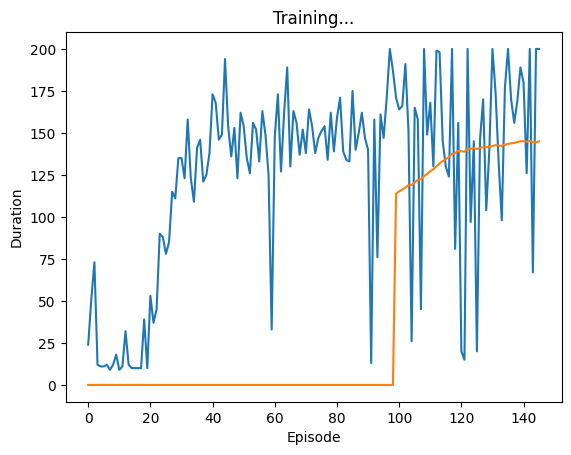

[198.0, 65.0, 198.0, 198.0, 144.0]
 Episode 146 finished after 146 steps


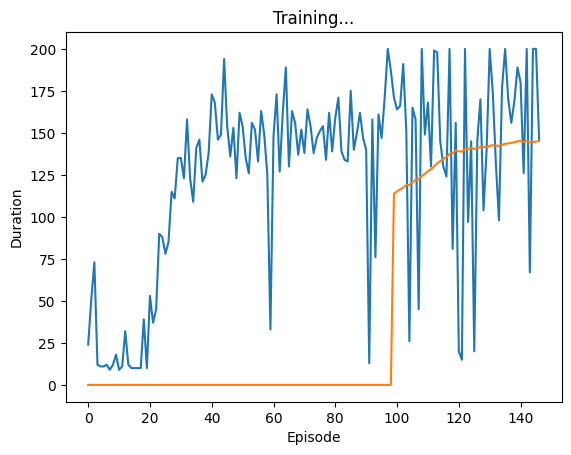

[65.0, 198.0, 198.0, 144.0, 198.0]
 Episode 147 finished after 200 steps


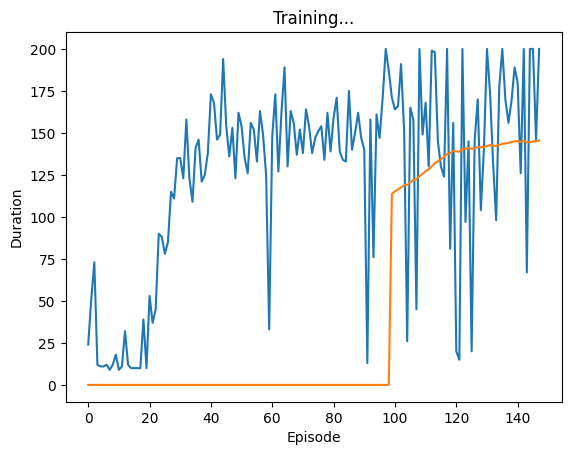

[198.0, 198.0, 144.0, 198.0, 142.0]
 Episode 148 finished after 144 steps


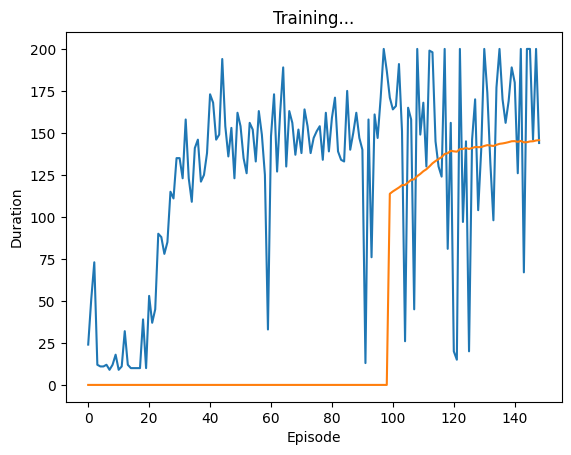

[198.0, 144.0, 198.0, 142.0, 167.0]
 Episode 149 finished after 169 steps


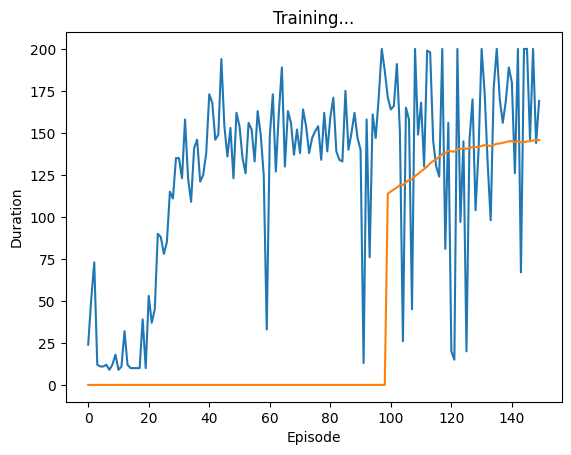

[144.0, 198.0, 142.0, 167.0, 173.0]
 Episode 150 finished after 175 steps


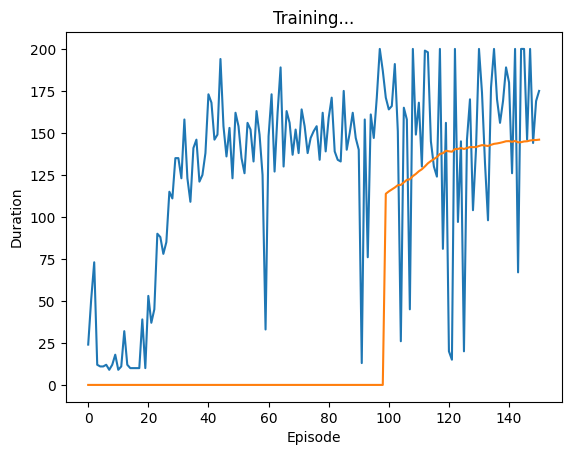

[198.0, 142.0, 167.0, 173.0, 198.0]
 Episode 151 finished after 200 steps


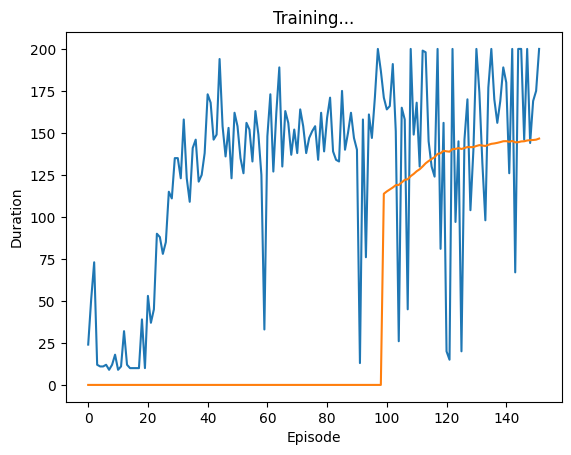

[142.0, 167.0, 173.0, 198.0, 185.0]
 Episode 152 finished after 187 steps


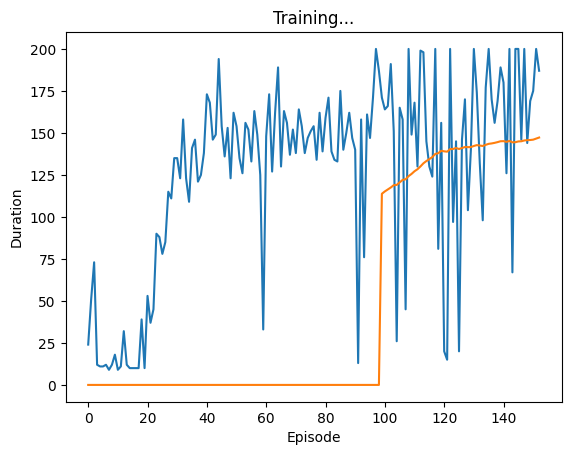

[167.0, 173.0, 198.0, 185.0, 177.0]
 Episode 153 finished after 179 steps


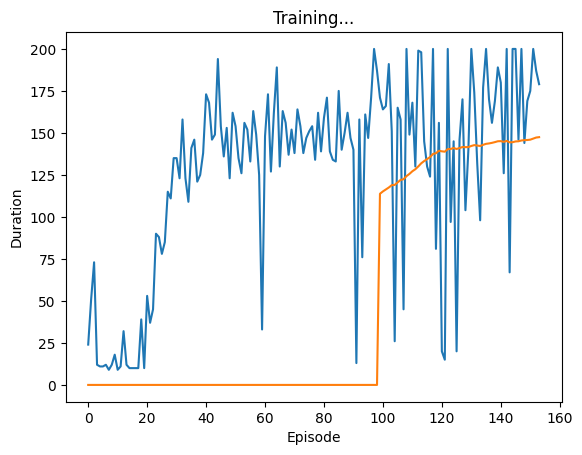

[173.0, 198.0, 185.0, 177.0, 198.0]
 Episode 154 finished after 200 steps


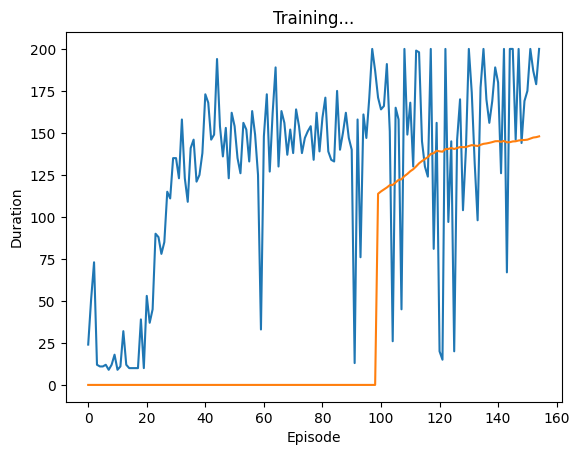

[198.0, 185.0, 177.0, 198.0, 198.0]
 Episode 155 finished after 200 steps


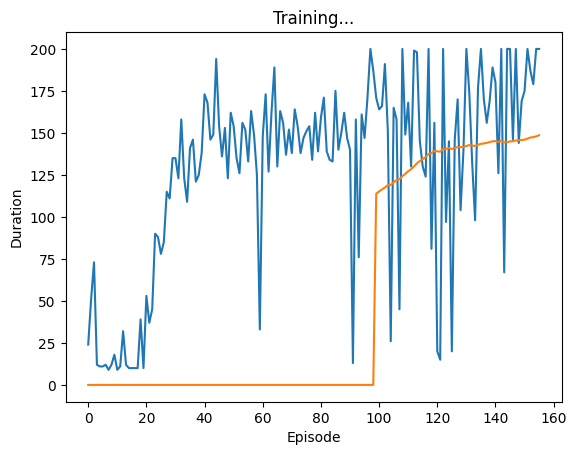

[185.0, 177.0, 198.0, 198.0, 198.0]
 Episode 156 finished after 200 steps


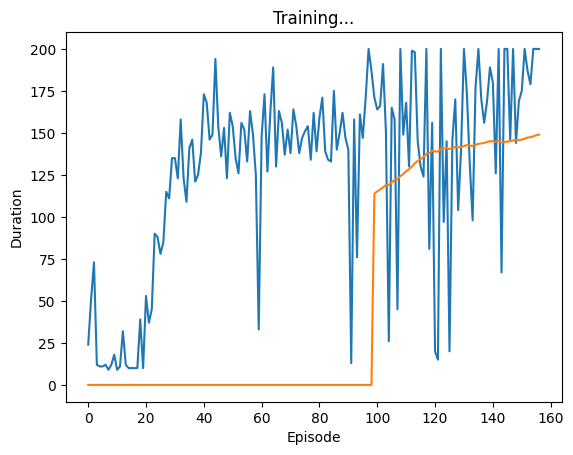

[177.0, 198.0, 198.0, 198.0, 181.0]
 Episode 157 finished after 183 steps


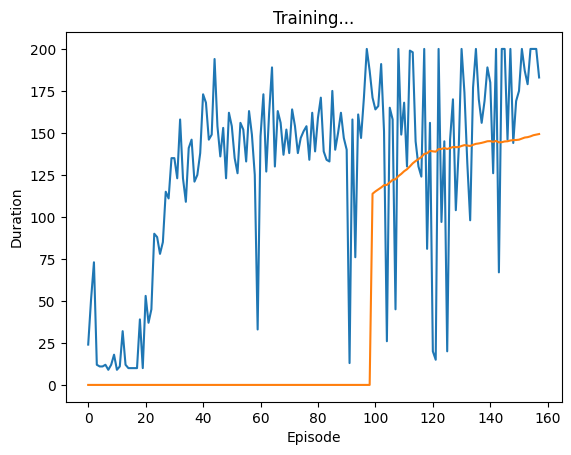

[198.0, 198.0, 198.0, 181.0, 198.0]
 Episode 158 finished after 200 steps


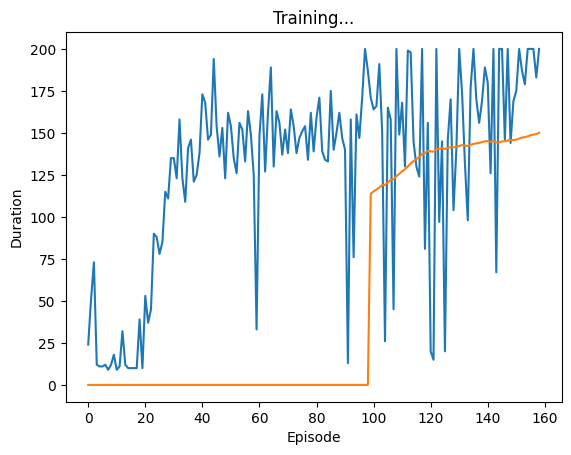

[198.0, 198.0, 181.0, 198.0, 198.0]
 Episode 159 finished after 200 steps


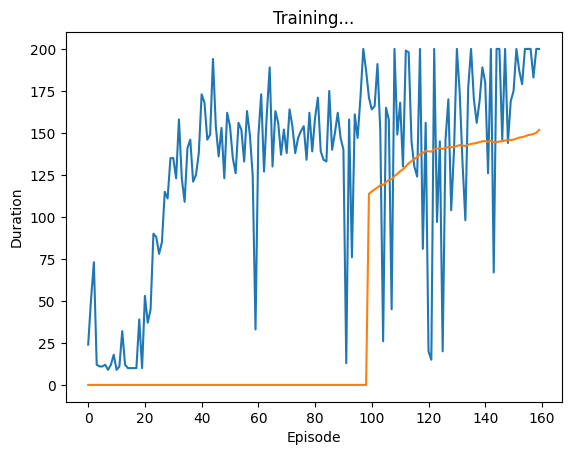

[198.0, 181.0, 198.0, 198.0, 188.0]
 Episode 160 finished after 190 steps


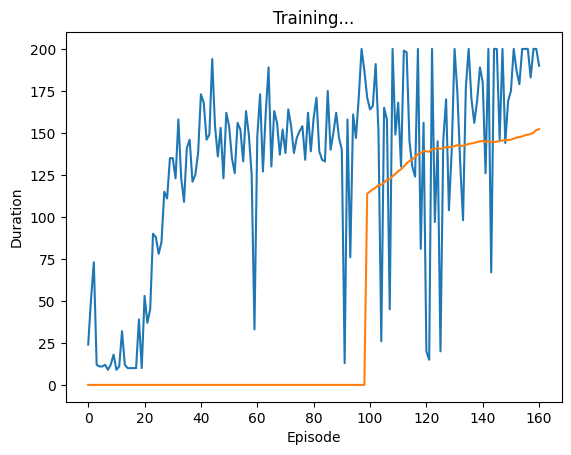

[181.0, 198.0, 198.0, 188.0, 161.0]
 Episode 161 finished after 163 steps


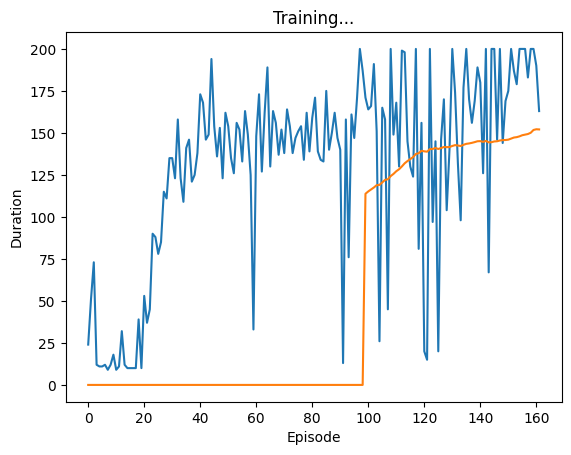

[198.0, 198.0, 188.0, 161.0, 167.0]
 Episode 162 finished after 169 steps


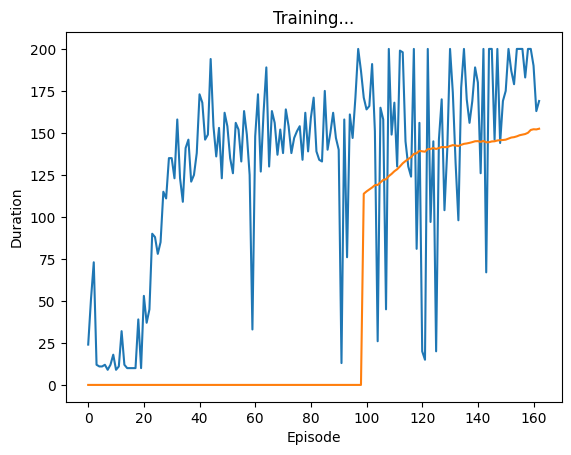

[198.0, 188.0, 161.0, 167.0, 172.0]
 Episode 163 finished after 174 steps


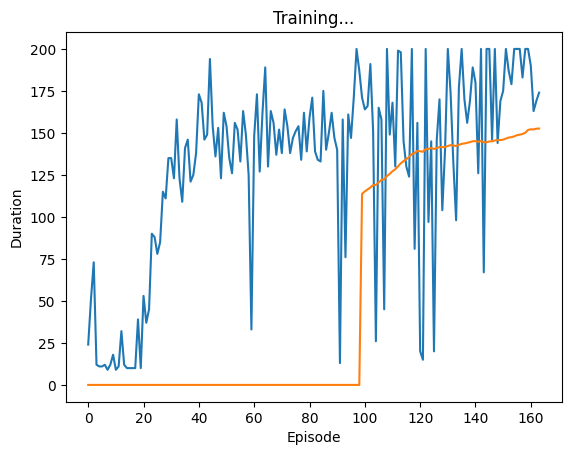

[188.0, 161.0, 167.0, 172.0, 99.0]
 Episode 164 finished after 101 steps


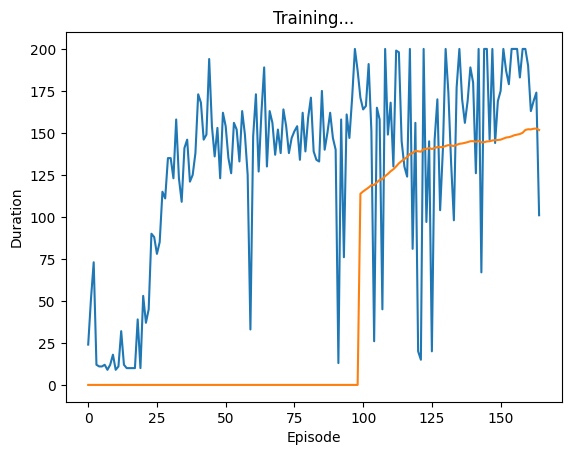

[161.0, 167.0, 172.0, 99.0, 57.0]
 Episode 165 finished after 59 steps


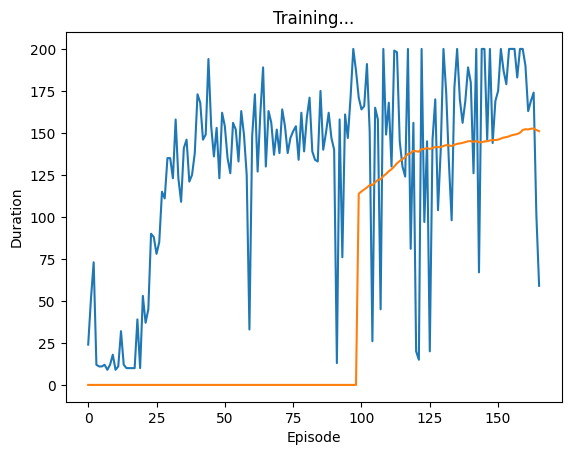

[167.0, 172.0, 99.0, 57.0, 183.0]
 Episode 166 finished after 185 steps


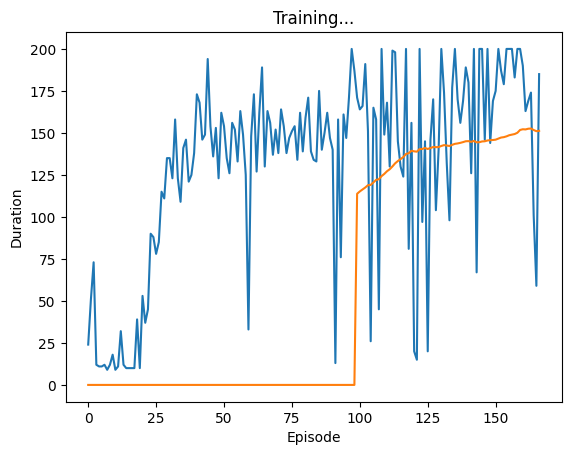

[172.0, 99.0, 57.0, 183.0, 198.0]
 Episode 167 finished after 200 steps


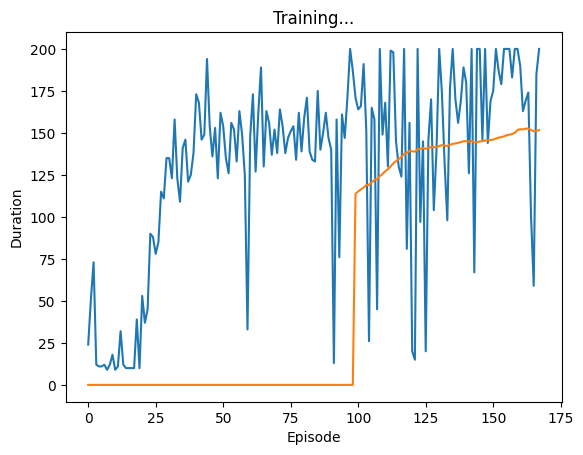

[99.0, 57.0, 183.0, 198.0, 148.0]
 Episode 168 finished after 150 steps


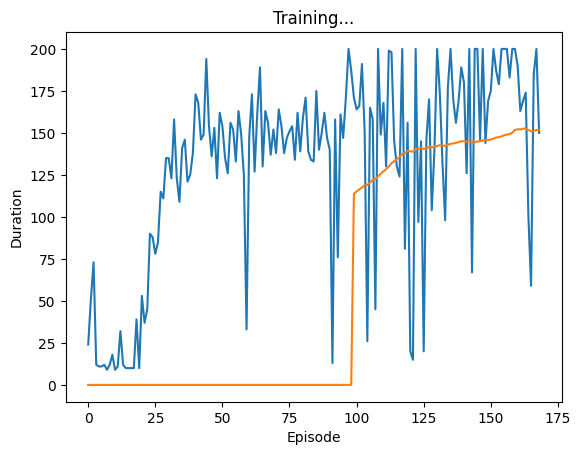

[57.0, 183.0, 198.0, 148.0, 151.0]
 Episode 169 finished after 153 steps


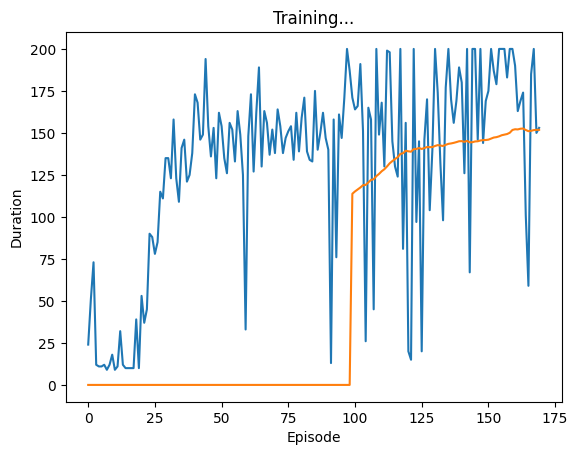

[183.0, 198.0, 148.0, 151.0, 170.0]
 Episode 170 finished after 172 steps


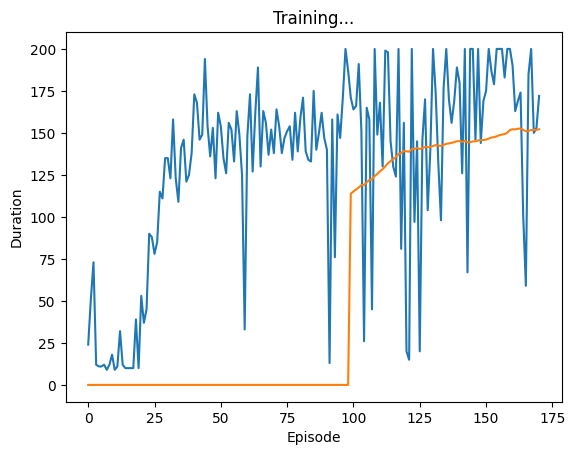

[198.0, 148.0, 151.0, 170.0, 145.0]
 Episode 171 finished after 147 steps


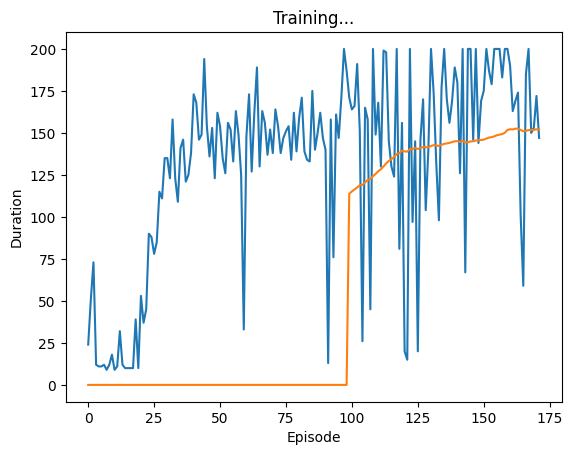

[148.0, 151.0, 170.0, 145.0, 198.0]
 Episode 172 finished after 200 steps


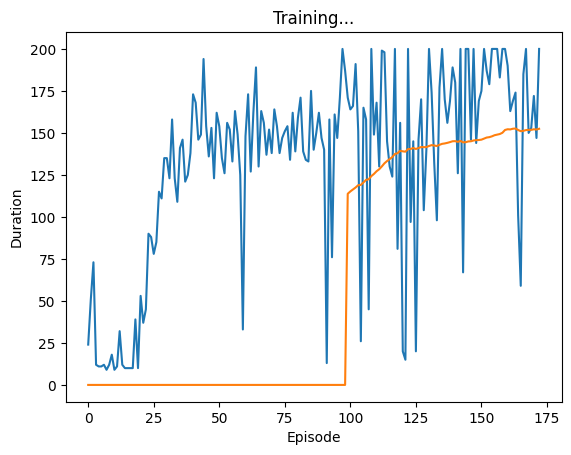

[151.0, 170.0, 145.0, 198.0, 198.0]
 Episode 173 finished after 200 steps


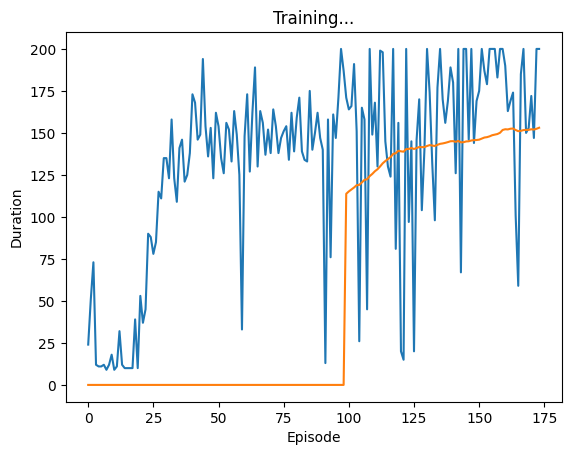

[170.0, 145.0, 198.0, 198.0, 198.0]
 Episode 174 finished after 200 steps


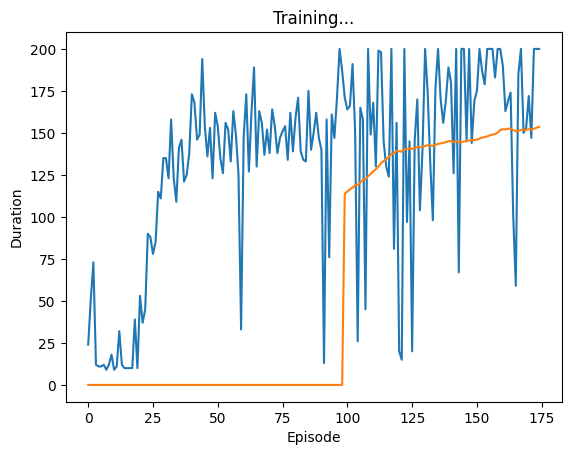

[145.0, 198.0, 198.0, 198.0, 198.0]
 Episode 175 finished after 200 steps


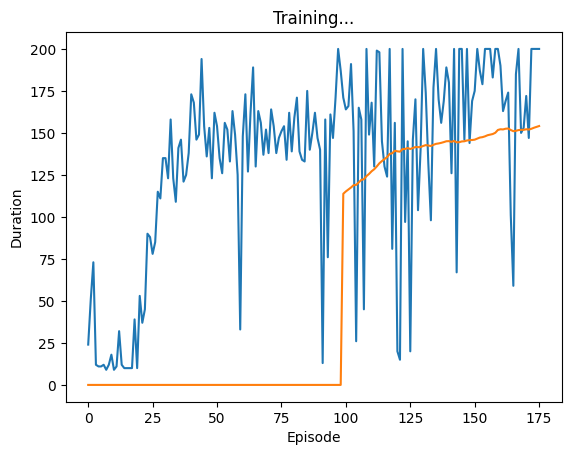

[198.0, 198.0, 198.0, 198.0, 198.0]
 Episode 176 finished after 200 steps


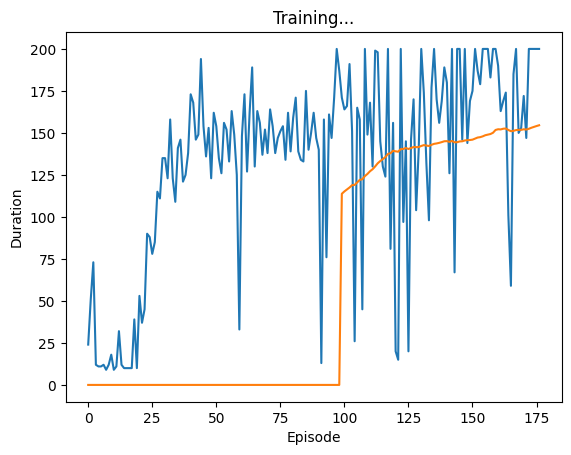

[198.0, 198.0, 198.0, 198.0, 198.0]
 Episode 177 finished after 200 steps


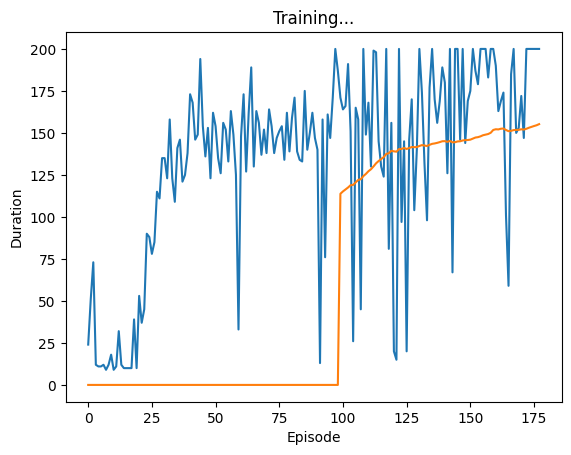

[198.0, 198.0, 198.0, 198.0, 198.0]
 Episode 178 finished after 200 steps


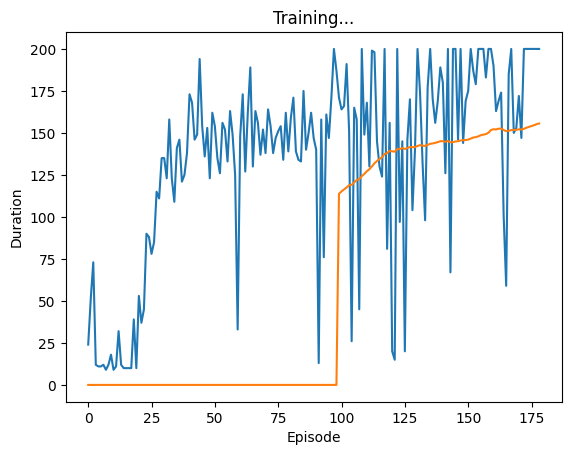

[198.0, 198.0, 198.0, 198.0, 198.0]
 Episode 179 finished after 200 steps


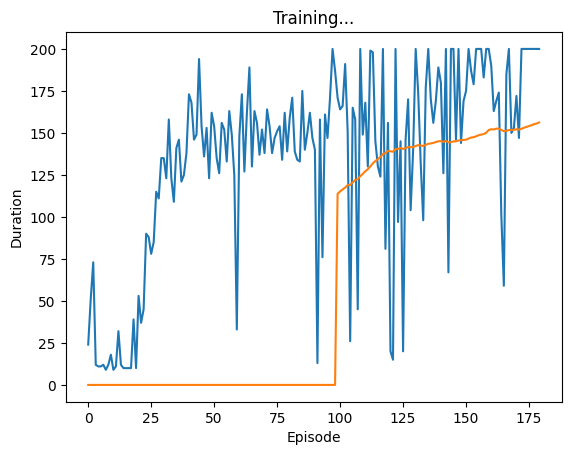

[198.0, 198.0, 198.0, 198.0, 169.0]
 Episode 180 finished after 171 steps


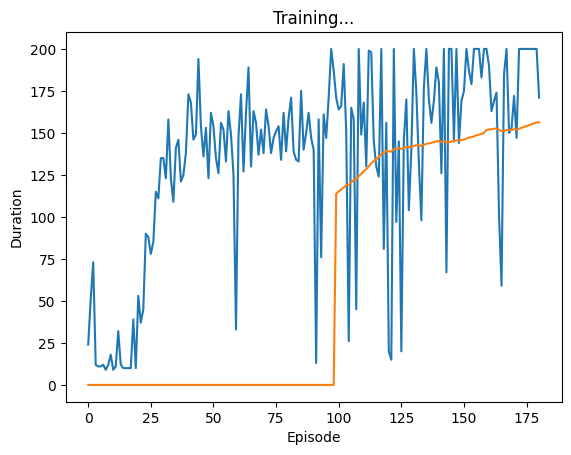

[198.0, 198.0, 198.0, 169.0, 175.0]
 Episode 181 finished after 177 steps


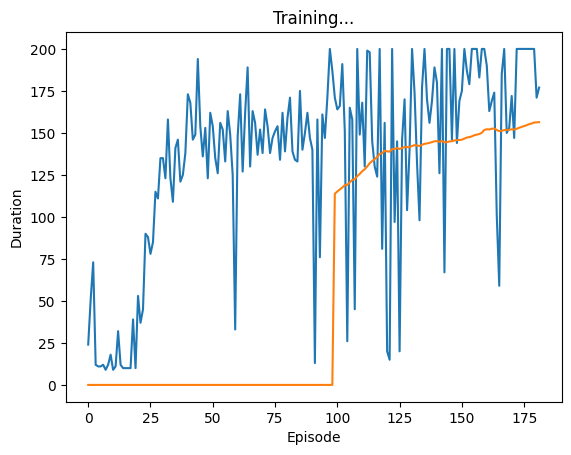

[198.0, 198.0, 169.0, 175.0, 198.0]
 Episode 182 finished after 200 steps


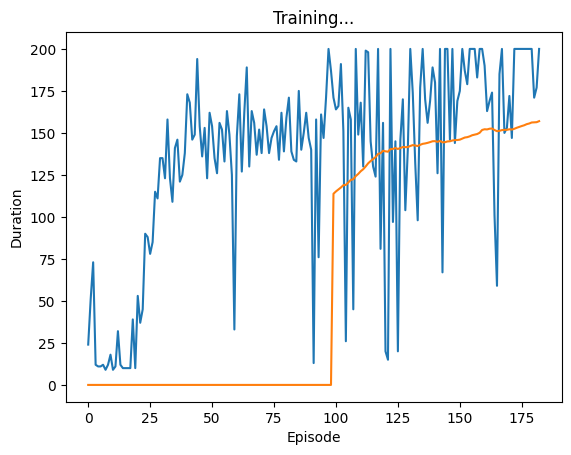

[198.0, 169.0, 175.0, 198.0, 171.0]
 Episode 183 finished after 173 steps


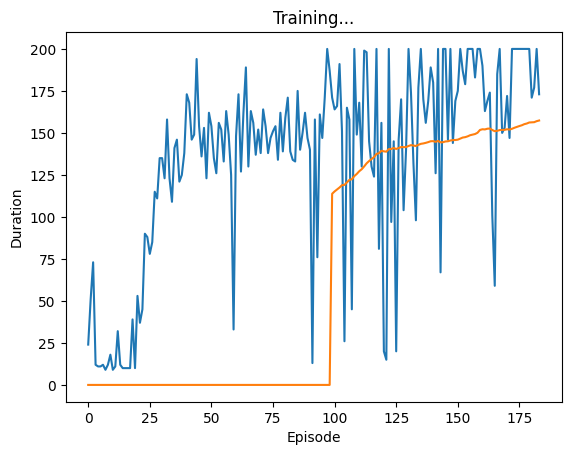

[169.0, 175.0, 198.0, 171.0, 198.0]
 Episode 184 finished after 200 steps


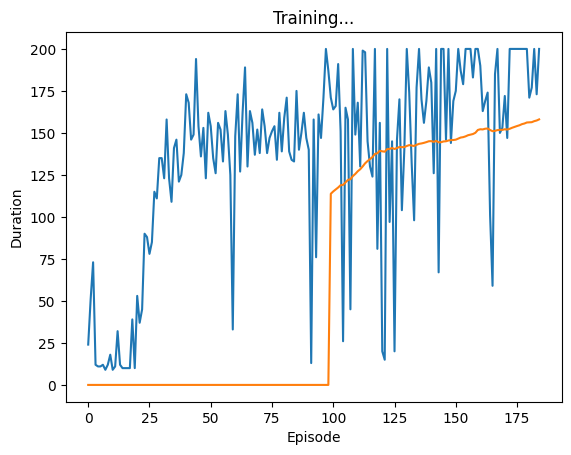

[175.0, 198.0, 171.0, 198.0, 175.0]
 Episode 185 finished after 177 steps


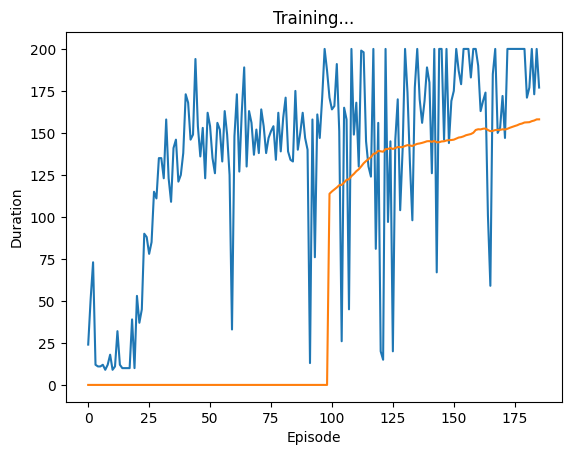

[198.0, 171.0, 198.0, 175.0, 198.0]
 Episode 186 finished after 200 steps


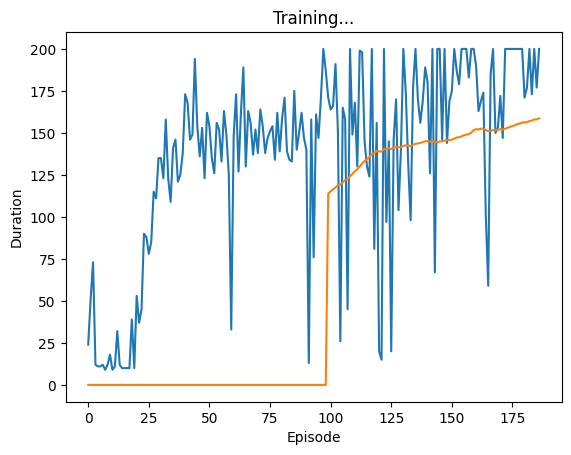

[171.0, 198.0, 175.0, 198.0, 24.0]
 Episode 187 finished after 26 steps


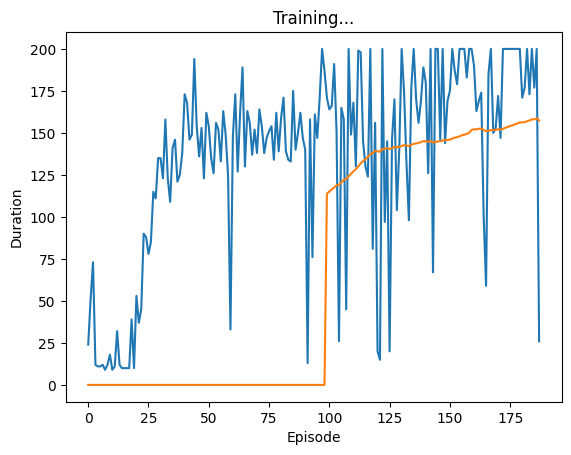

[198.0, 175.0, 198.0, 24.0, 142.0]
 Episode 188 finished after 144 steps


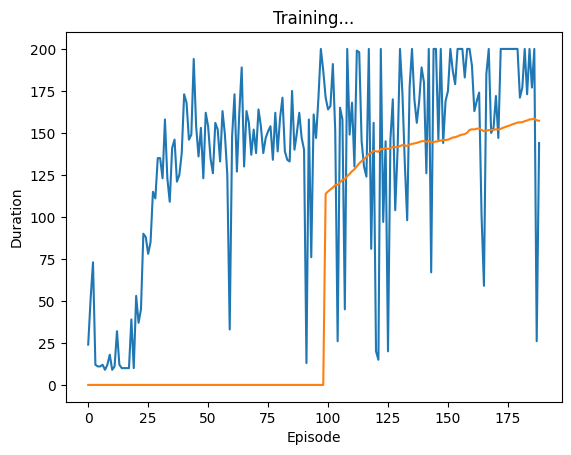

[175.0, 198.0, 24.0, 142.0, 186.0]
 Episode 189 finished after 188 steps


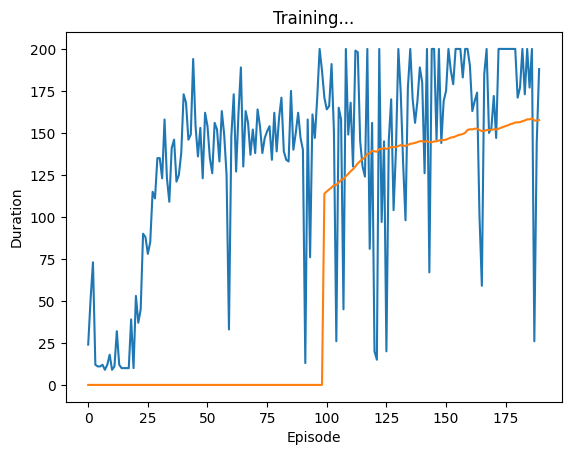

[198.0, 24.0, 142.0, 186.0, 164.0]
 Episode 190 finished after 166 steps


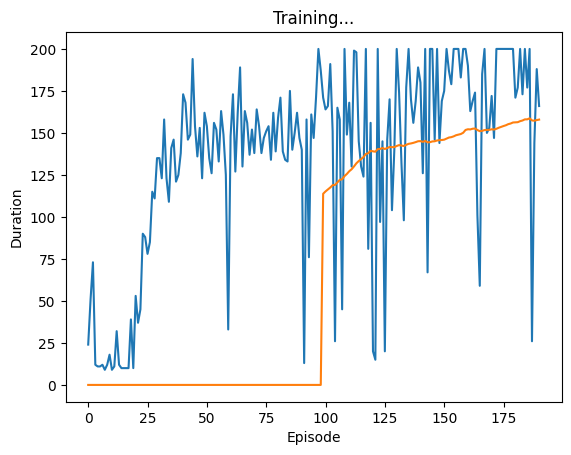

[24.0, 142.0, 186.0, 164.0, 152.0]
 Episode 191 finished after 154 steps


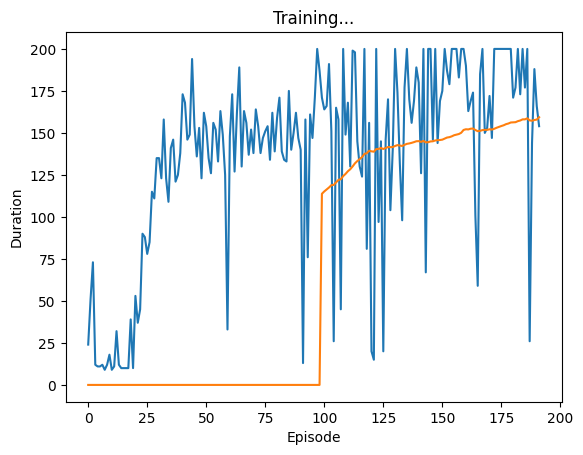

[142.0, 186.0, 164.0, 152.0, 198.0]
 Episode 192 finished after 200 steps


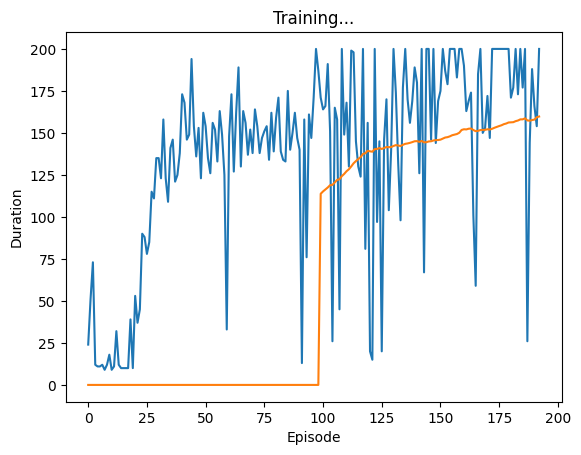

[186.0, 164.0, 152.0, 198.0, 181.0]
 Episode 193 finished after 183 steps


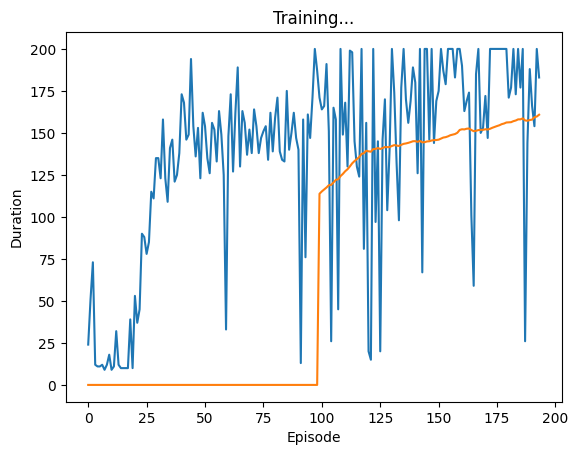

[164.0, 152.0, 198.0, 181.0, 198.0]
 Episode 194 finished after 200 steps


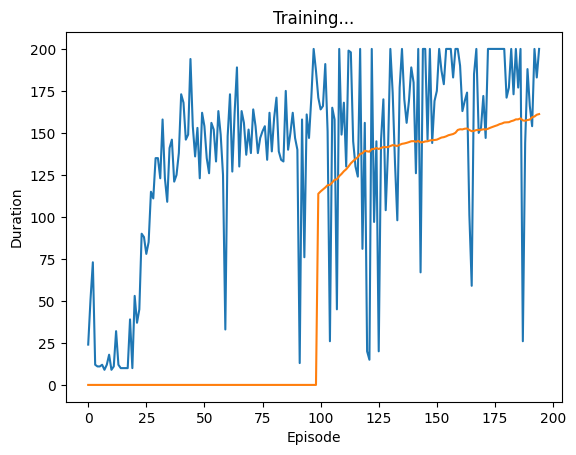

[152.0, 198.0, 181.0, 198.0, 24.0]
 Episode 195 finished after 26 steps


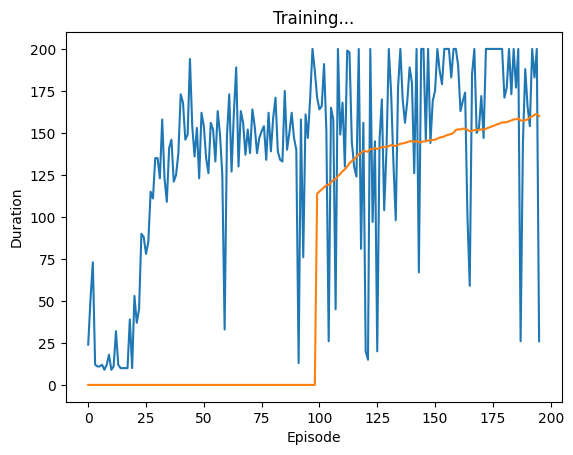

[198.0, 181.0, 198.0, 24.0, 175.0]
 Episode 196 finished after 177 steps


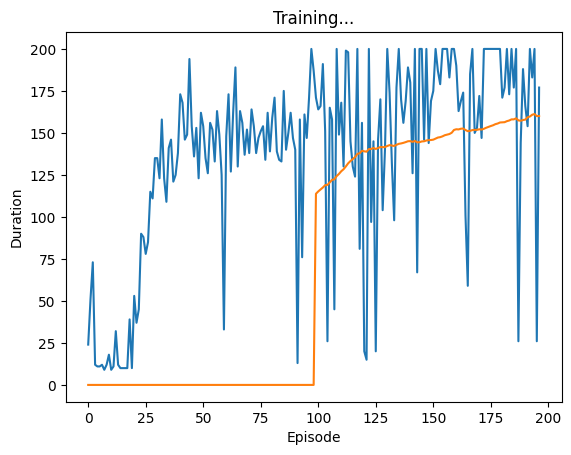

[181.0, 198.0, 24.0, 175.0, 122.0]
 Episode 197 finished after 124 steps


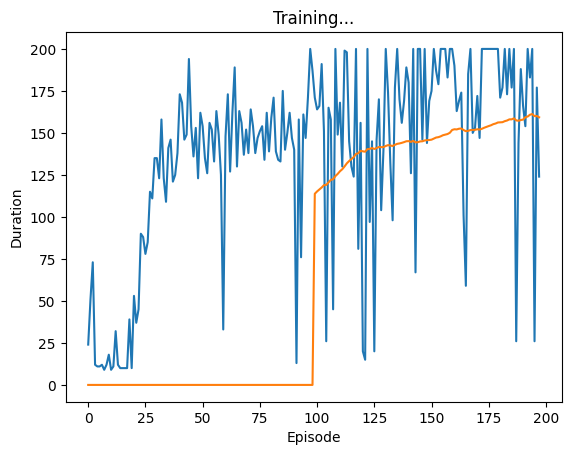

[198.0, 24.0, 175.0, 122.0, 198.0]
 Episode 198 finished after 200 steps


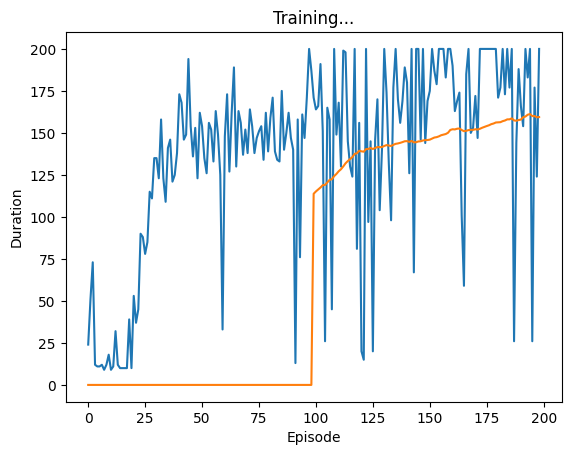

[24.0, 175.0, 122.0, 198.0, 87.0]
 Episode 199 finished after 89 steps


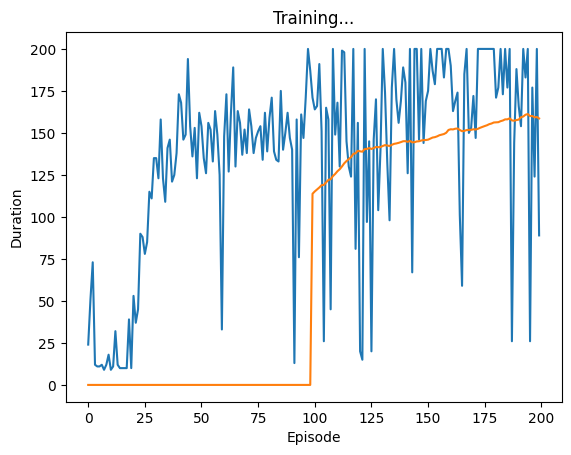

Complete


In [22]:
for e in range(EPISODES):
    run_episode(e, env)

print('Complete')
# env.render(close=True)
env.close()
plt.ioff()
plt.show()

In [23]:
global savedStates
outputList = []
min = 5
for tuple in savedStates:
    outputList.append(tuple[0]+[tuple[1]])

print(outputList[1])


[0.030753007158637047, -0.19445845484733582, -0.035968389362096786, 0.23797348141670227, 1]


In [24]:
import csv
global savedStates
global outputList

with open("output.csv", "w") as f:
    writer = csv.writer(f)
    writer.writerows(outputList)

In [25]:
from torch.utils.data import Dataset, DataLoader
class CartPoleDataset(Dataset):
    def __init__(self):
        data = np.loadtxt('output.csv', delimiter=",", dtype = np.float32)
        self.state = torch.from_numpy(data[:,0:-1])
        self.action = torch.from_numpy(data[:,-1].astype(int))
        self.n_samples = self.state.shape[0]
        self.output_dim = len(torch.unique(self.action))
    
    def __getitem__(self, index):
        return self.state[index], self.action[index]

    def __len__(self):
        return self.n_samples


In [26]:
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(RNN, self).__init__()
        self.hidden_size = hidden_size
        self.rnn = nn.RNN(input_size, hidden_size, batch_first = True)
        #input shape -> batch_size, input_size
        self.fc = nn.Linear(hidden_size, num_classes)
    
    def forward(self, input):
        # print(input.size())
        h0 = torch.zeros(1,self.hidden_size)
        # print(h0.size())
        out, h_n = self.rnn(input, h0.detach())

        out = self.fc(out)

        return out




In [41]:
dataset = CartPoleDataset()
dataloader = DataLoader(dataset=dataset, batch_size = 4, shuffle = True, num_workers=2)
print(dataset.n_samples)
input_size = dataset.state.size(dim=1)
hidden_size = 16

print(sum(dataset.action))

rnn = RNN(input_size, hidden_size, dataset.output_dim)

criterion = torch.nn.CrossEntropyLoss()
learning_rate = 0.001
optimizer = torch.optim.Adam(rnn.parameters(), lr=learning_rate)
num_epoch = 2

for epoc in range(num_epoch):
    print(epoc)
    epoch_loss = 0
    num_correct = 0
    for i, (states, actions) in enumerate(dataloader):
        rnn.zero_grad()
        #Forward pass
        prediction = rnn(states)
        loss = criterion(prediction, actions)

        #Backwards pass
        # optimizer.zero_grad()
        loss.backward()

        #Update
        optimizer.step()
        # print(prediction)
        # print(loss)

2493
tensor(1278)
0
1


In [59]:
def policy(state):
    return torch.max(rnn(torch.from_numpy(np.array([state]))),1)[1].item()

rewardSum = 0
env2 = gym.make('CartPole-v1')
state = env2.reset()
for i in range(100):
    while True:
        action = policy(state)
        # print(action)
        state, reward, done, _ = env2.step(action)

        rewardSum+=reward
        env2.render()
        if done:
            print(rewardSum)
            rewardSum = 0
            state = env2.reset()
            break
print('Complete')
# env.render(close=True)
env.close()



/home/ploctor/.local/lib/python3.10/site-packages/gym/core.py:49: DeprecationWarning: WARN: You are calling render method, but you didn't specified the argument render_mode at environment initialization. To maintain backward compatibility, the environment will render in human mode.
If you want to render in human mode, initialize the environment in this way: gym.make('EnvName', render_mode='human') and don't call the render method.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(


194.0
203.0
191.0
208.0
211.0
206.0
200.0
193.0
193.0
182.0
199.0
191.0


In [ ]:
print(len(dataset.action))